In [17]:
from google.colab import drive
drive.mount("/content/gdrive/")

%cd "/content/gdrive/My Drive/Colab Notebooks/bikes-theft-model"

# Libraries: Standard ones
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
import csv

# Library for boxplots
import seaborn as sns
import pandas as pd

#GRAPHS CLASS
from Codigos.DataStatistics import GraphsStatistics as gp


Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).
/content/gdrive/My Drive/Colab Notebooks/bikes-theft-model


# Nuevo analisis

In [2]:
def plot_corr(df):
    correlation_mat = df.corr()
    f, ax = plt.subplots(figsize=(17, 9))
    sns.heatmap(correlation_mat, annot = True)
    plt.show()

In [ ]:
df_c = pd.read_csv("Data/DataCensus_100.csv", header=0,delimiter=';')
bicly = df_c['v_CA16_5807: Bicycle']
df_c.drop(labels=['v_CA16_5807: Bicycle'], axis=1,inplace = True)
df_c.insert(0, 'v_CA16_5807: Bicycle', bicly)

lis1=list(range(0,8))
lis2=list(range(30,41))
lis3=list(range(41,50))
lis4=list(range(50,61))
lis5=list(range(61,71))
lis6=list(range(71,81))
lis7=list(range(81,90))

listtotal2=lis1 + lis2
listtotal3=lis1+ lis3
listtotal4=lis1+ lis4
listtotal5=lis1+ lis5
listtotal6=lis1+ lis6
listtotal7=lis1+ lis7


frame_1=df_c.iloc[:,:-60]
frame_2=df_c.iloc[:,listtotal2]
frame_3=df_c.iloc[:,listtotal3]
frame_4=df_c.iloc[:,listtotal4]
frame_5=df_c.iloc[:,listtotal5]
frame_6=df_c.iloc[:,listtotal6]
frame_7=df_c.iloc[:,listtotal7]

frame_1.to_csv("Data/DataCensus_100_1.csv")
frame_2.to_csv("Data/DataCensus_100_2.csv")
frame_3.to_csv("Data/DataCensus_100_3.csv")
frame_4.to_csv("Data/DataCensus_100_4.csv")
frame_5.to_csv("Data/DataCensus_100_5.csv")
frame_6.to_csv("Data/DataCensus_100_6.csv")
frame_7.to_csv("Data/DataCensus_100_7.csv")

In [ ]:
len(frame_1.columns)

50

In [ ]:
df_c = pd.read_csv("Data/DataCensus_100_1.csv", header=0).drop(columns = ["Type", "Region Name"]).replace({"x":np.nan, "F":np.nan})
df_c["GeoUID"] = df_c["GeoUID"].astype(str)
# display(df_census)


df_bike = pd.read_csv("./Data/Bicycle_Thefts_Toronto_geo.csv",header=0)
df_bike["GeoUID"] = df_bike["GeoUID"].astype(str)
df_bike["Occurrence_Date"] = pd.to_datetime(df_bike["Occurrence_Date"])
# display(df_bike)

print(df_c.columns)
print(df_bike.columns)

Index(['Unnamed: 0', 'v_CA16_5807: Bicycle', 'GeoUID', 'Area (sq km)',
       'Population ', 'Dwellings ', 'Households ', 'v_CA16_5: 0 to 14 years',
       'v_CA16_4: 0 to 14 years', 'v_CA16_6: 0 to 14 years',
       'v_CA16_62: 15 to 64 years', 'v_CA16_61: 15 to 64 years',
       'v_CA16_63: 15 to 64 years', 'v_CA16_245: 65 years and over',
       'v_CA16_244: 65 years and over', 'v_CA16_246: 65 years and over',
       'v_CA16_380: Average age', 'v_CA16_379: Average age',
       'v_CA16_381: Average age', 'v_CA16_386: 0 to 14 years',
       'v_CA16_385: 0 to 14 years', 'v_CA16_387: 0 to 14 years',
       'v_CA16_389: 15 to 64 years', 'v_CA16_388: 15 to 64 years',
       'v_CA16_390: 15 to 64 years', 'v_CA16_392: 65 years and over',
       'v_CA16_391: 65 years and over', 'v_CA16_393: 65 years and over',
       'v_CA16_395: 85 years and over'],
      dtype='object')
Index(['X', 'Y', 'FID', 'Index_', 'event_unique_id', 'Primary_Offence',
       'Occurrence_Date', 'Occurrence_Year', 'Occ

In [ ]:
#####Configuration of OcurrenceDate##########
day_type = pd.api.types.CategoricalDtype(categories=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"], ordered=True)


df_bike['Occurrence_Date']=pd.to_datetime(df_bike['Occurrence_Date']) 
df_bike['Week_day']=df_bike['Occurrence_Date'].dt.day_name() 
df_bike["Week_day"] = df_bike["Week_day"].astype(day_type)

In [ ]:
Dias_aux_week=df_bike[(df_bike['Occurrence_Year']==2015) & (df_bike['Status']=='STOLEN' )].groupby(['Week_day']).size().reset_index().rename(columns={0:'Count'})
fig = px.bar(Dias_aux_week, x='Week_day', y='Count',title='Bicycle theft in Toronto per day')
fig.show()

In [ ]:
Dias_aux_week=df_bike[(df_bike['Occurrence_Year']==2015) & (df_bike['Status']=='STOLEN' )].groupby(['Occurrence_Day']).size().reset_index().rename(columns={0:'Count'})
fig = px.bar(Dias_aux_week, x='Occurrence_Day', y='Count',title='Bicycle theft in Toronto per day')
fig.show()

In [ ]:


df_bike = df_bike[(df_bike["Status"] == "STOLEN")].groupby(["GeoUID", "Occurrence_Date"]).agg({"X":"size", "Cost_of_Bike":"mean"}).reset_index().rename(columns={"X":"TheftNum"}) 
df_total = df_census.merge(df_bike, on = "GeoUID", how = "right").drop(columns = ["GeoUID"]).replace({"x":np.nan, "F":np.nan})
for col in df_total:
    if col != "Occurrence_Date" :
      df_total[col] = df_total[col].astype(float)

df_total.columns
#df3["Perc"] = df3["Theft"] / df3["v_CA16_5807: Bicycle"] / df3["Area (sq km)"] * 100.0

# plot_corr(df3)

In [ ]:
colums = df_total.columns.to_list()


In [27]:
# Analysis from January 1st to "until_date" in month-day format. Columns format short or long
def fields_census_analysis(census_path, theft_path = "./Data/Bicycle_Thefts_Toronto_geo.csv", until_date = "01-15", columns_short = True): 
    # Read data and clean
    df_census = pd.read_csv(census_path, header = 0, dtype = {"GeoUID":str}).\
        drop(columns = ["Type", "Region Name"]).replace({"x":np.nan, "F":np.nan})
    df_census["GeoUID"] = df_census["GeoUID"].apply(lambda x: x if len(x.split(".")[-1]) > 1 else x + "0") # Fix important bug
    for col in df_census: # Type change
        df_census[col] = df_census[col].astype(float) if col != "GeoUID" else df_census[col]
    df_theft = pd.read_csv(theft_path, dtype = {"GeoUID":str})
    df_theft["GeoUID"] = df_theft["GeoUID"].apply(lambda x: x if len(x.split(".")[-1]) > 1 else x + "0") # Fix important bug

    # Data process: Get Total theft by sum registers and mean cost of bike by CT and date
    df_theft["Occurrence_Date"] = pd.to_datetime(df_theft["Occurrence_Date"])
    
    df_theft = df_theft[df_theft["Status"] == "STOLEN"].groupby(["GeoUID", pd.Grouper(key="Occurrence_Date", freq="1W-MON")]).\
        agg({"X":"count", "Cost_of_Bike":"mean", "Occurrence_Year":lambda x: x.iloc[0]}).\
        reset_index().rename(columns={"X":"Total_Theft_Bikes"}).sort_values("Occurrence_Date")

    display(df_theft.columns, df_census.columns)
    # Process by year: Split data in "date"-columns to ['Total_Theft_Bikes', 'Cost_of_Bike']
    for year in df_theft["Occurrence_Year"].unique():
        df_theft_year = df_theft[df_theft["Occurrence_Year"] == year].drop(columns = "Occurrence_Year")
        df_theft_year = df_theft_year[df_theft_year["Occurrence_Date"] <= "{}-{}".format(year, until_date)]
        df_theft_year = df_theft_year.pivot(index = 'GeoUID', columns = 'Occurrence_Date', values = ['Total_Theft_Bikes', 'Cost_of_Bike'])

        # Fix columns names
        df_theft_year = df_theft_year.T.reset_index().T
        df_theft_year.columns = df_theft_year.T["level_0"] + "in" + df_theft_year.T["Occurrence_Date"].astype(str) # New name
        df_theft_year = df_theft_year.drop(["level_0", "Occurrence_Date"])
        
        # Merge data with census info and corr plot
        df_census_theft = df_census.merge(df_theft_year, left_on = "GeoUID", right_index = True, how = "left").fillna(0) # NaN = 0 thefts
        for col_theft in [x for x in df_census_theft.columns if "Theft" in x]:
            df_census_theft["%{}/Area".format(col_theft)] = df_census_theft[col_theft] * 100.0
            df_census_theft["%{}/Area".format(col_theft)] /= df_census_theft['v_CA16_5807: Bicycle'] * df_census_theft['Area (sq km)']
        if columns_short:
            df_census_theft.columns = [x[:32] for x in df_census_theft.columns] # 8 characters maximum
        plot_corr(df_census_theft)



In [ ]:
fields_census_analysis(census_path = "./Data/DataCensus_100_1.csv")

Index(['GeoUID', 'Occurrence_Date', 'Total_Theft_Bikes', 'Cost_of_Bike',
       'Occurrence_Year'],
      dtype='object')

Index(['v_CA16_5807: Bicycle', 'GeoUID', 'Area (sq km)', 'Population ',
       'Dwellings ', 'Households ', 'v_CA16_394: 85 years and over',
       'v_CA16_396: 85 years and over',
       'v_CA16_407: Land area in square kilometres',
       'v_CA16_406: Population density per square kilometre',
       'v_CA16_401: Population, 2016',
       'v_CA16_418: Private households by household size',
       'v_CA16_424: Number of persons in private households',
       'v_CA16_425: Average household size',
       'v_CA16_478: Total - Census families in private households by family size - 100% data',
       'v_CA16_483: Average size of census families',
       'v_CA16_485: Total couple families'],
      dtype='object')

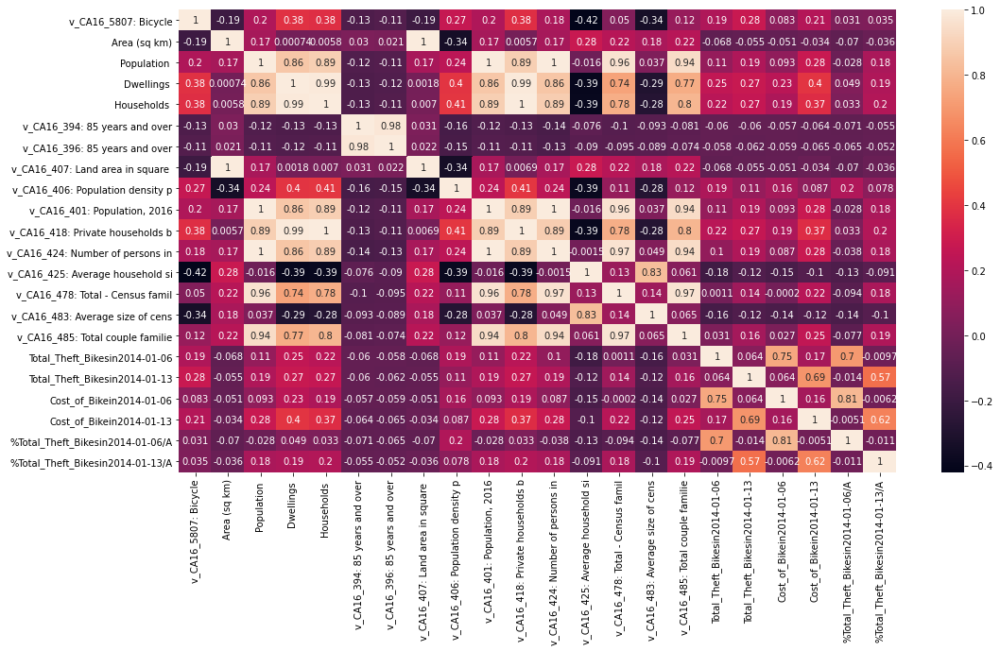

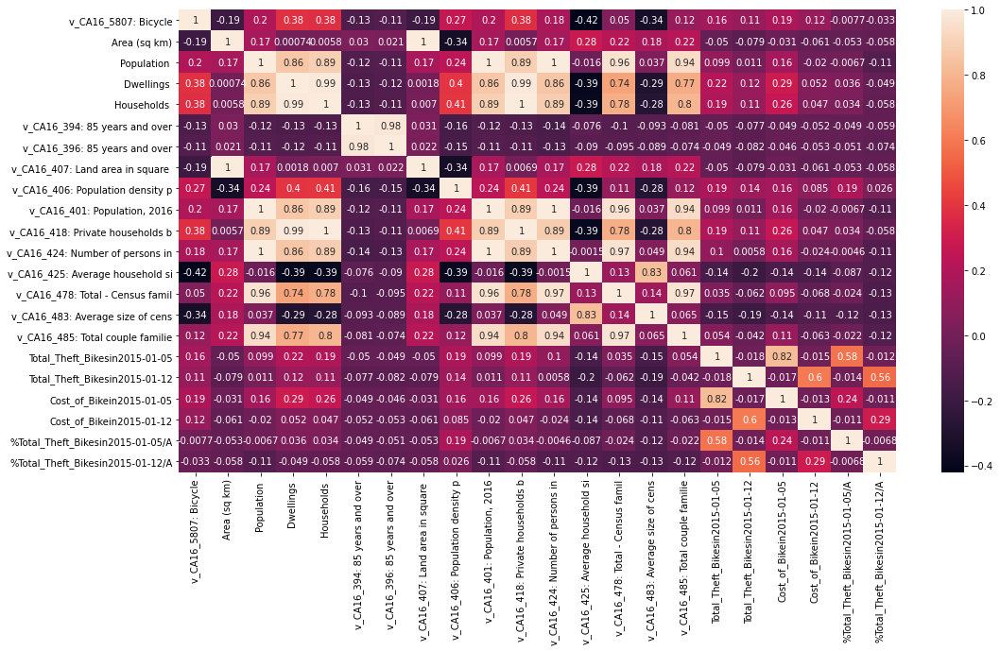

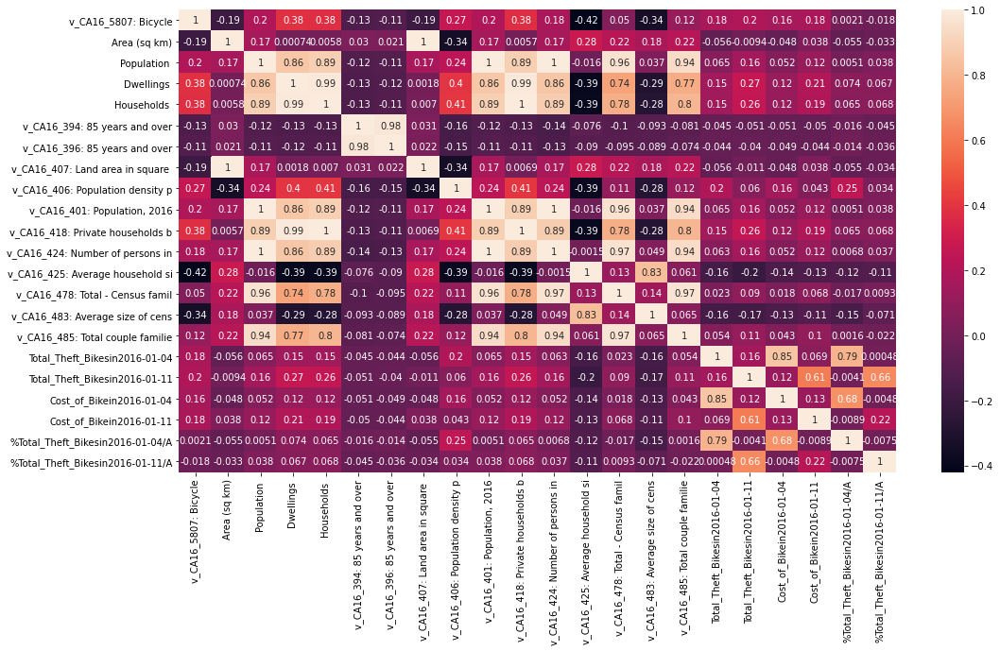

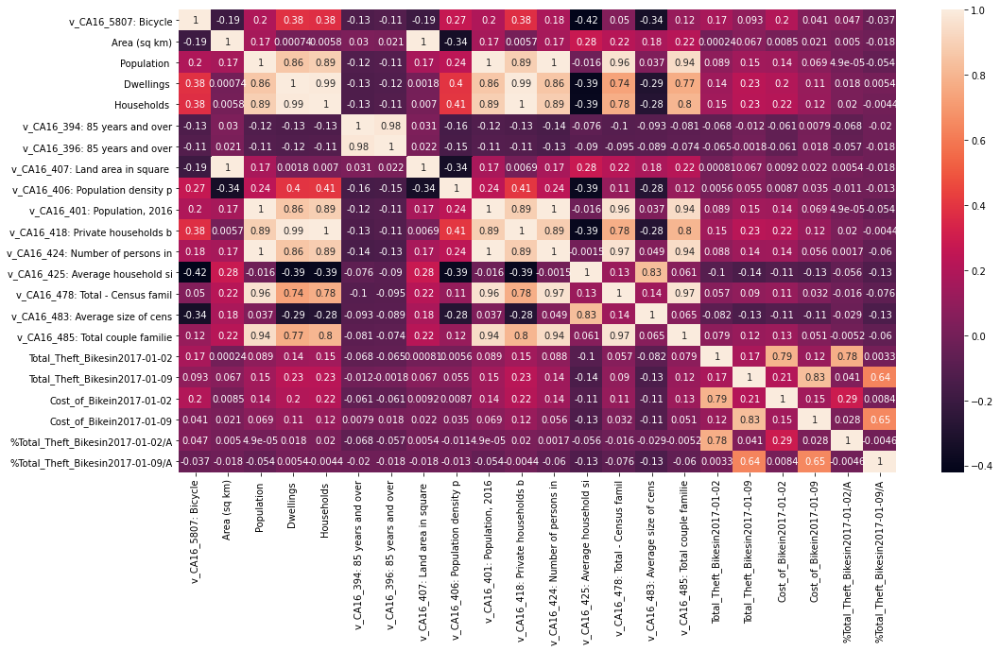

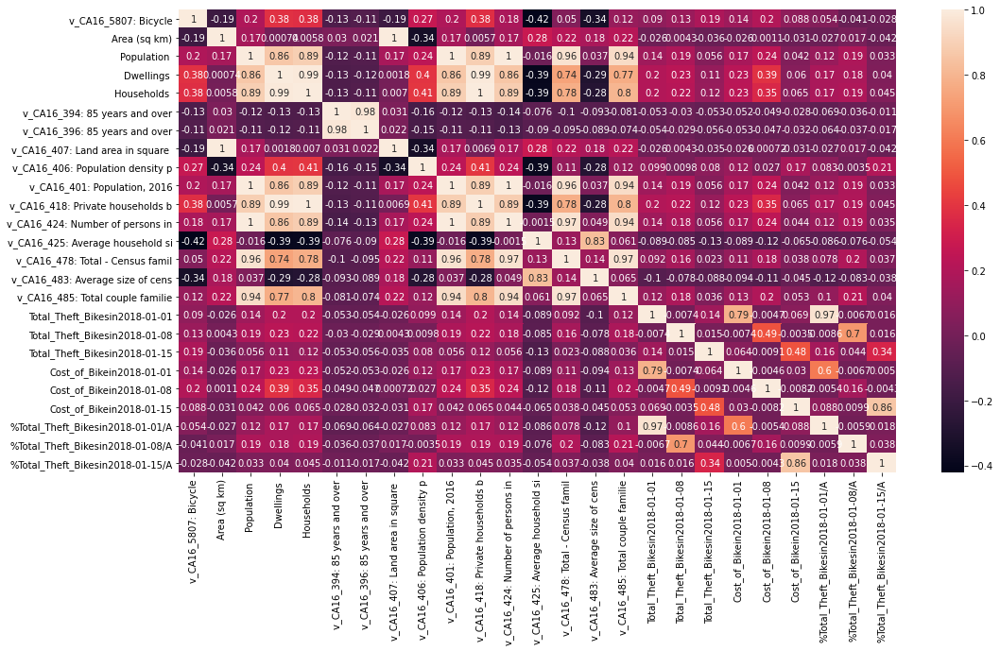

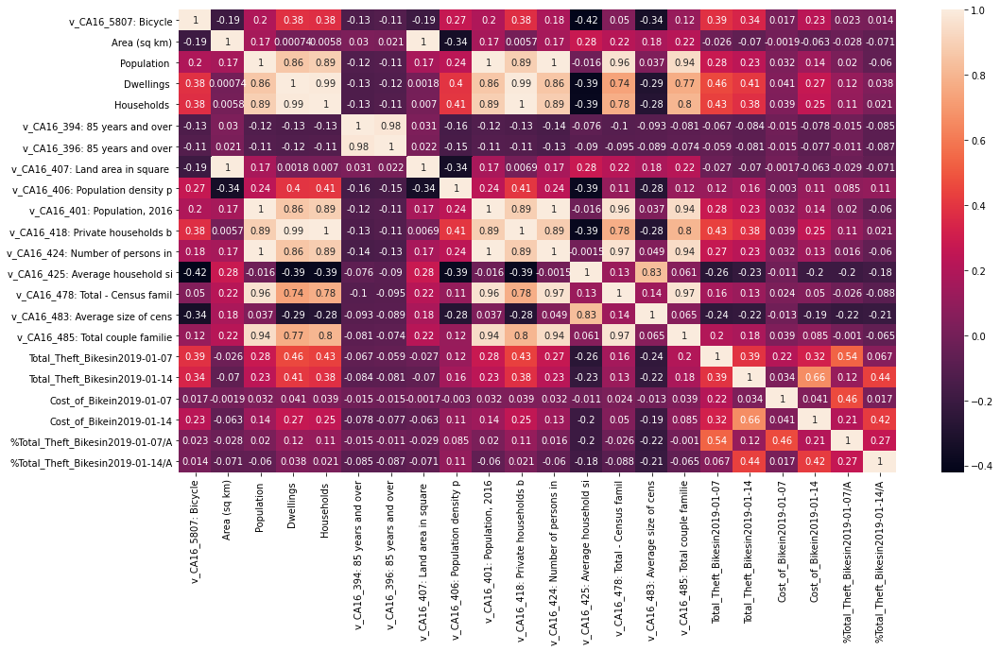

In [4]:
fields_census_analysis(census_path = "./Data/DataCensus_100_2.csv")

Index(['GeoUID', 'Occurrence_Date', 'Total_Theft_Bikes', 'Cost_of_Bike',
       'Occurrence_Year'],
      dtype='object')

Index(['v_CA16_5807: Bicycle', 'GeoUID', 'Area (sq km)', 'Population ',
       'Dwellings ', 'Households ',
       'v_CA16_488: Total lone-parent families by sex of parent',
       'v_CA16_491: Total - Couple census families in private households - 100% data',
       'v_CA16_497: Total - Lone-parent census families in private households - 100% data',
       'v_CA16_502: Total - Persons not in census families in private households - 100% data',
       'v_CA16_501: Total - Persons not in census families in private households - 100% data',
       'v_CA16_503: Total - Persons not in census families in private households - 100% data',
       'v_CA16_505: One-census-family households',
       'v_CA16_508: Multiple-census-family households',
       'v_CA16_509: Non-census-family households'],
      dtype='object')

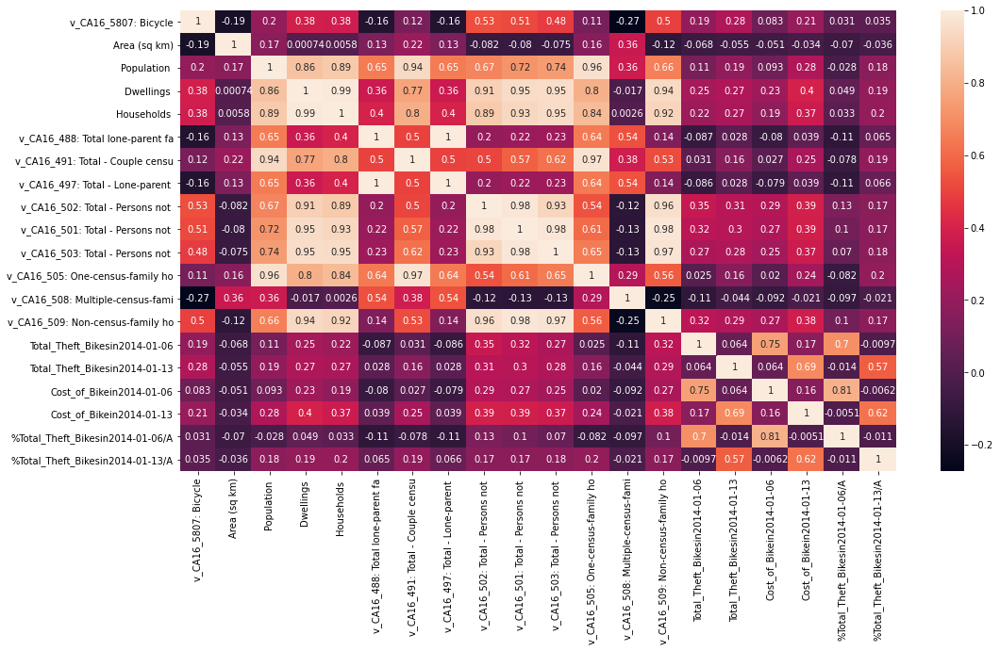

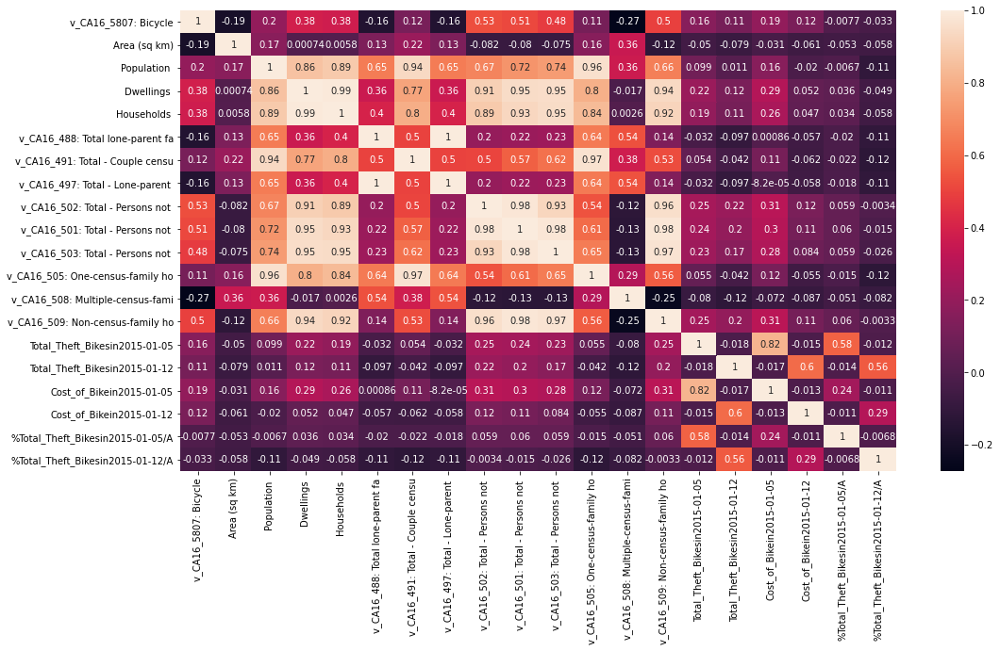

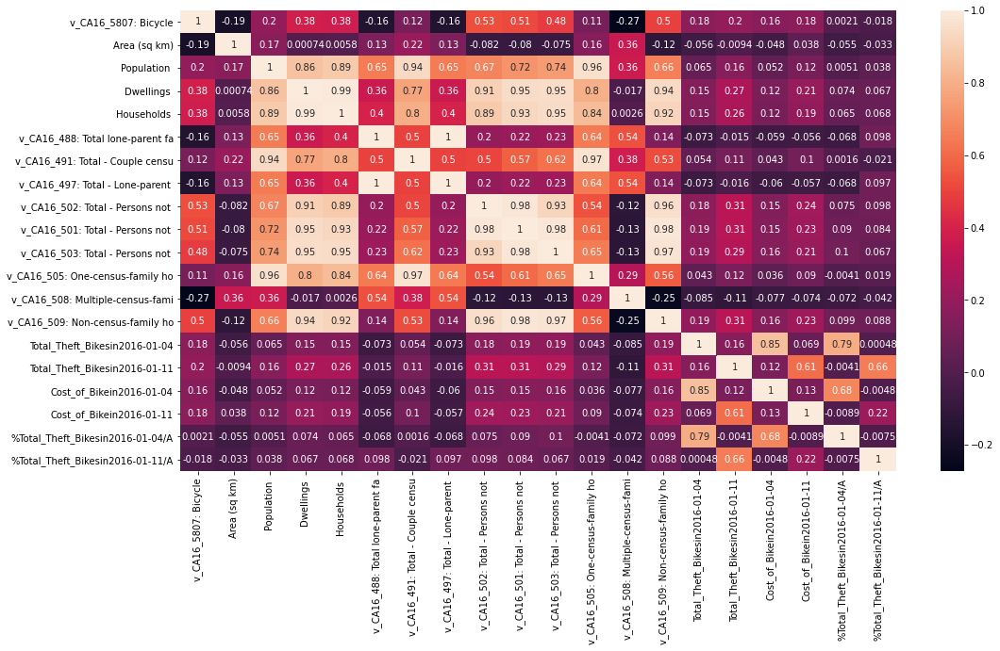

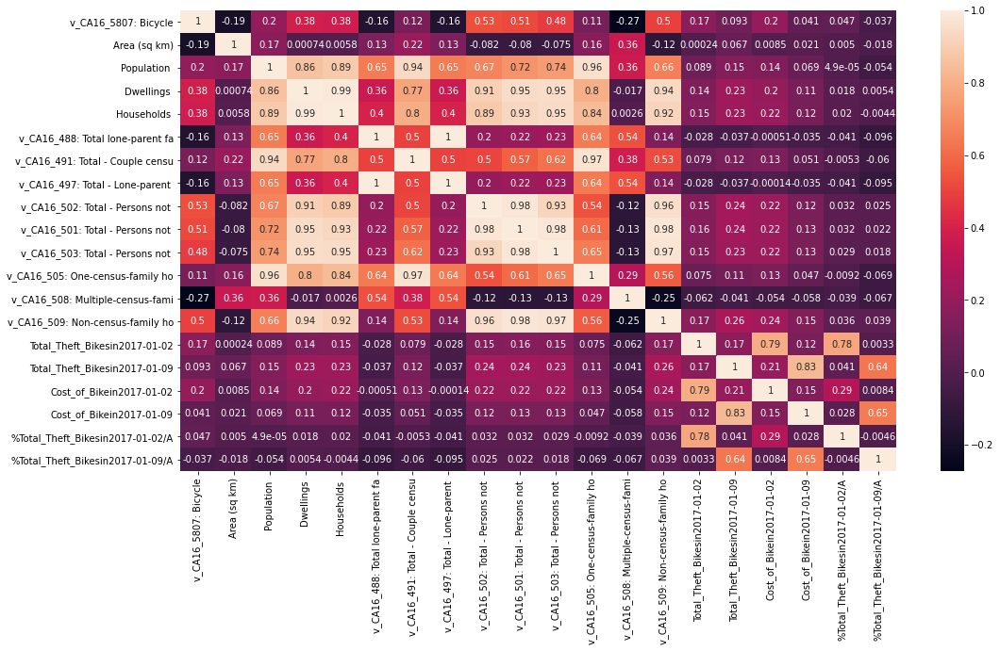

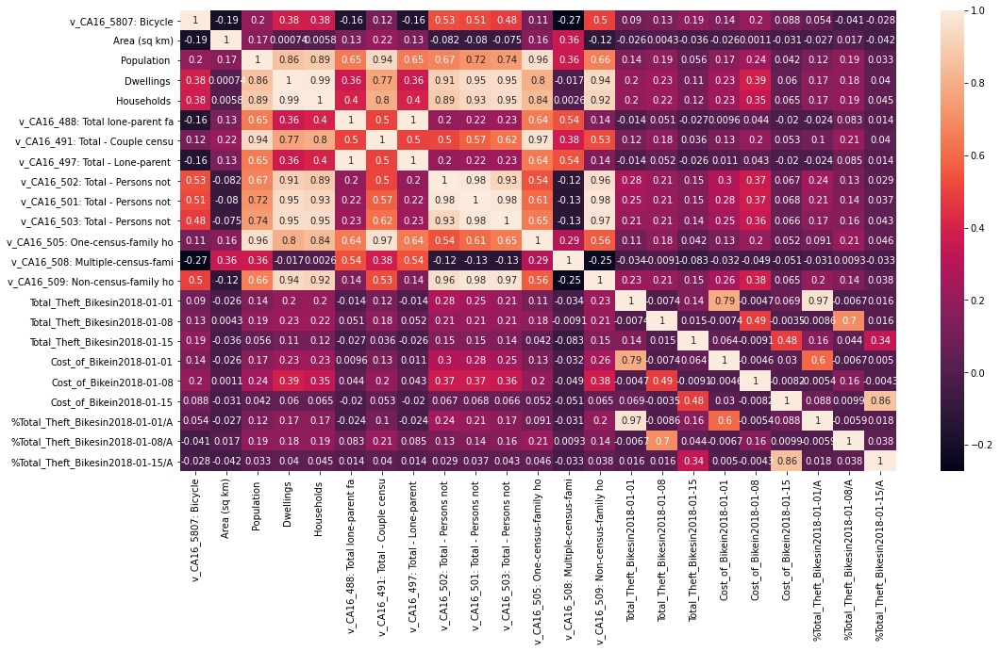

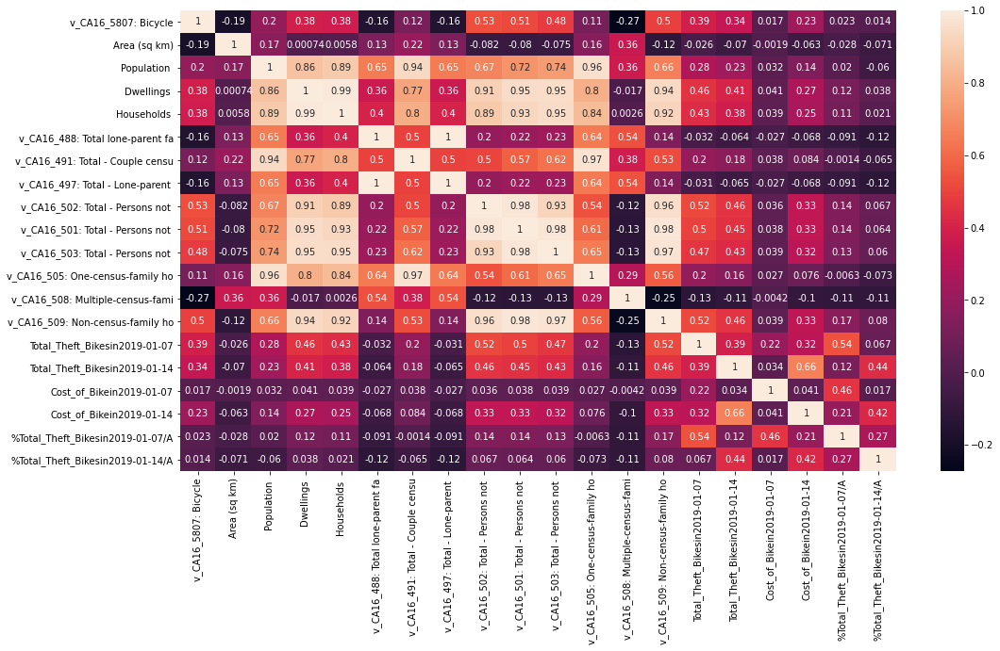

In [5]:
fields_census_analysis(census_path = "./Data/DataCensus_100_3.csv")

Index(['GeoUID', 'Occurrence_Date', 'Total_Theft_Bikes', 'Cost_of_Bike',
       'Occurrence_Year'],
      dtype='object')

Index(['v_CA16_5807: Bicycle', 'GeoUID', 'Area (sq km)', 'Population ',
       'Dwellings ', 'Households ',
       'v_CA16_504: Total - Private households by household type - 100% data',
       'v_CA16_2201: Total - Income statistics in 2015 for the population aged 15 years and over in private households - 100% data',
       'v_CA16_2246: Total - Total income groups in 2015 for the population aged 15 years and over in private households - 100% data',
       'v_CA16_2297: Total - After-tax income groups in 2015 for the population aged 15 years and over in private households - 100% data',
       'v_CA16_2348: Without employment income',
       'v_CA16_2351: With employment income',
       'v_CA16_2396: Total - Income statistics in 2015 for private households by household size - 100% data',
       'v_CA16_2400: Median total income of one-person households in 2015 ($)',
       'v_CA16_2401: Median after-tax income of one-person households in 2015 ($)',
       'v_CA16_2403: Median total inc

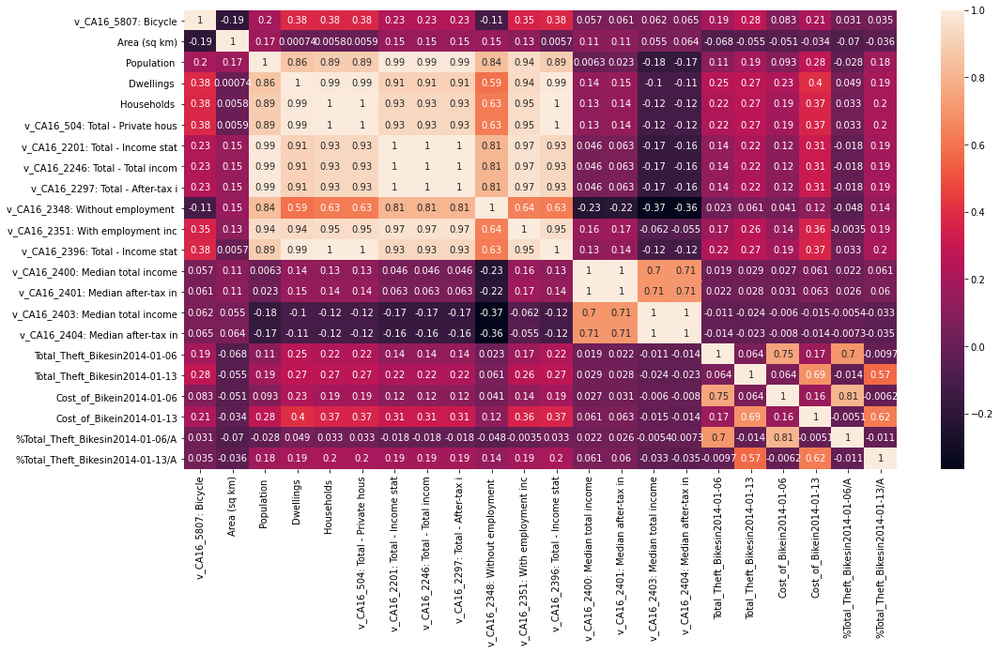

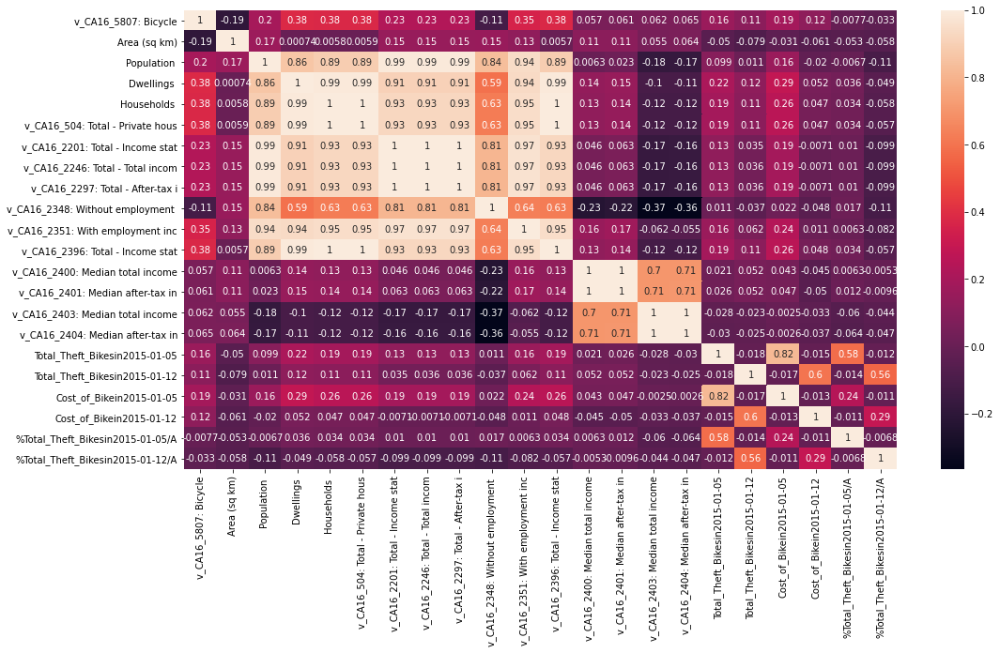

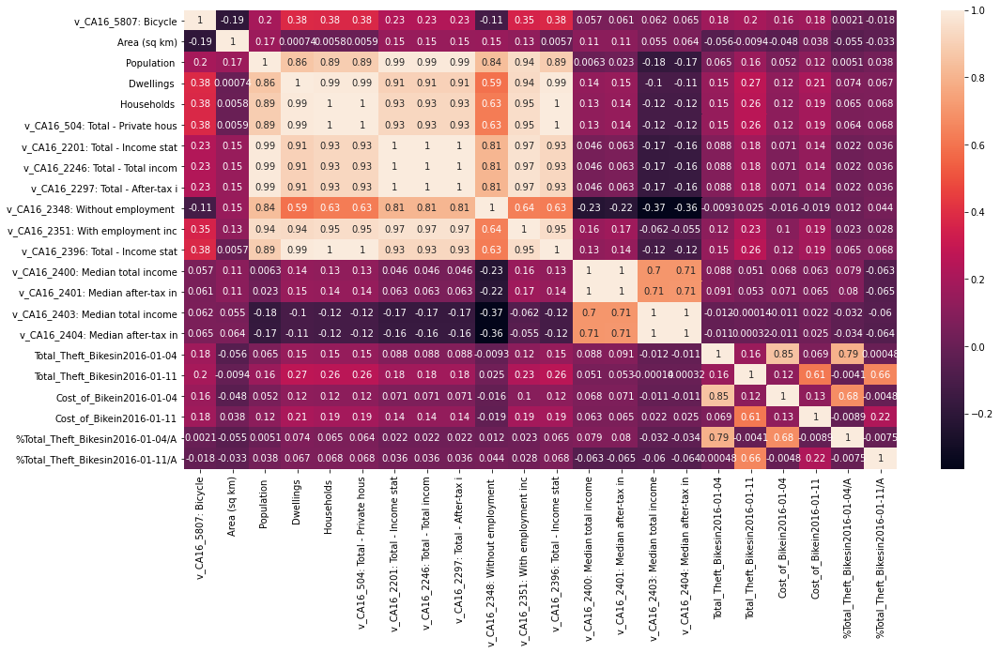

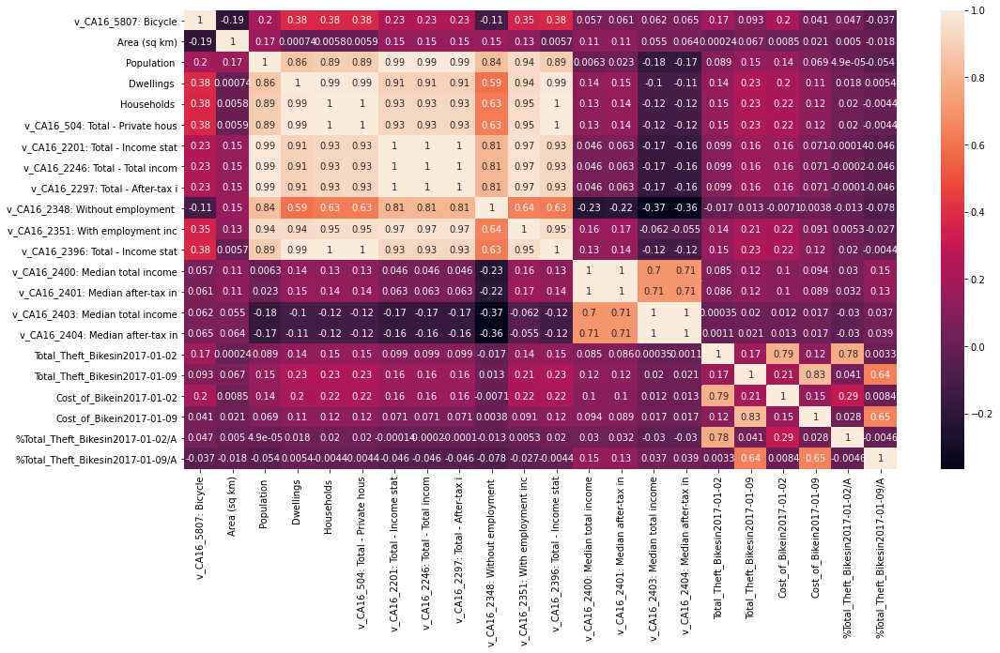

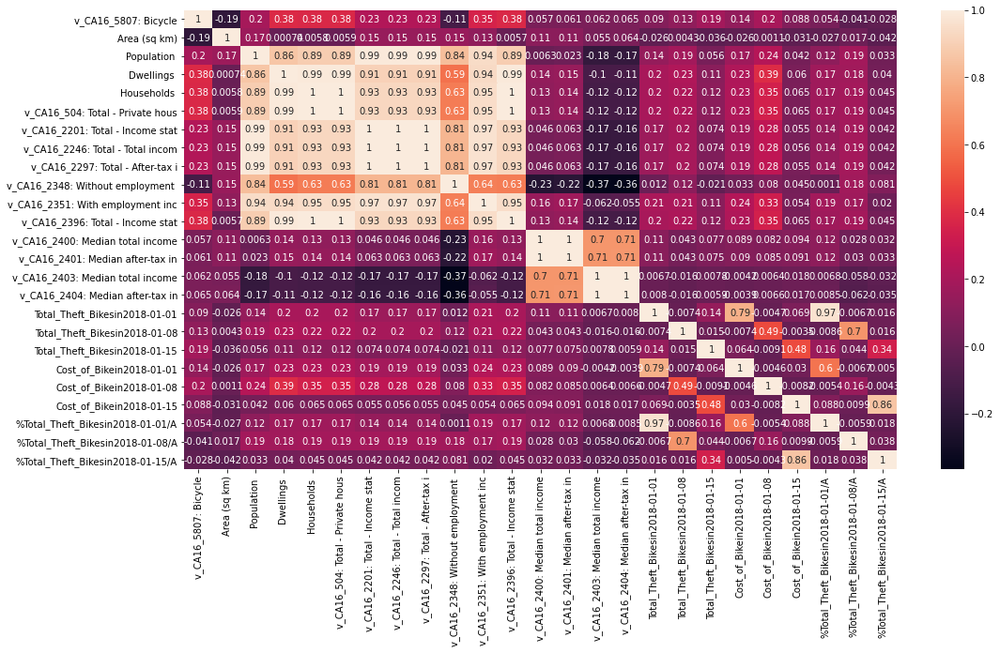

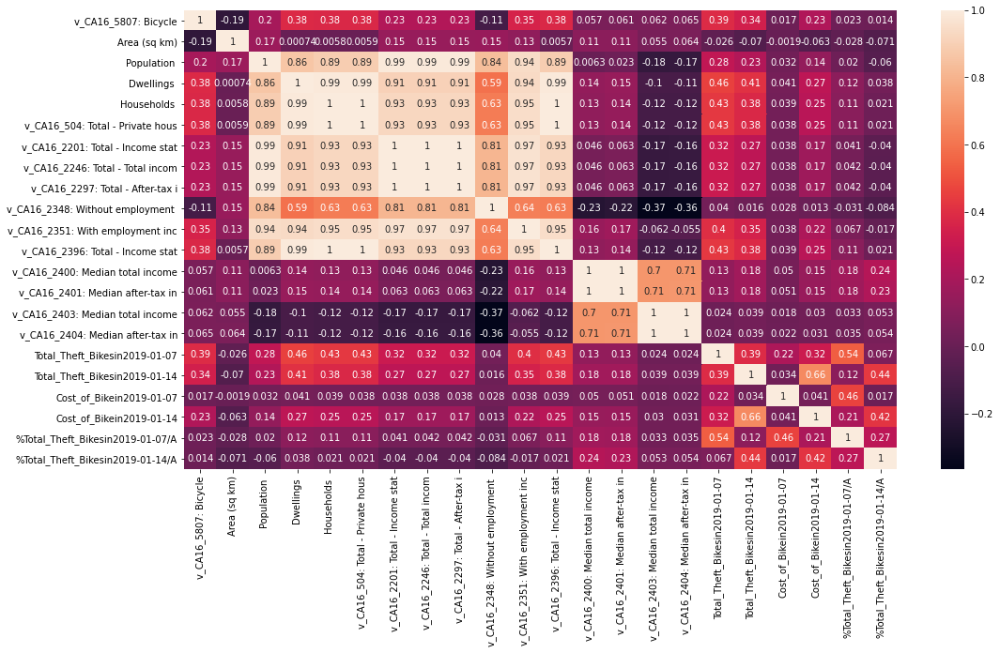

In [6]:
fields_census_analysis(census_path = "./Data/DataCensus_100_4.csv")

Index(['GeoUID', 'Occurrence_Date', 'Total_Theft_Bikes', 'Cost_of_Bike',
       'Occurrence_Year'],
      dtype='object')

Index(['v_CA16_5807: Bicycle', 'GeoUID', 'Area (sq km)', 'Population ',
       'Dwellings ', 'Households ', 'v_CA16_2406: Under $5,000',
       'v_CA16_2407: $5,000 to $9,999', 'v_CA16_2408: $10,000 to $14,999',
       'v_CA16_2409: $15,000 to $19,999', 'v_CA16_2410: $20,000 to $24,999',
       'v_CA16_2411: $25,000 to $29,999', 'v_CA16_2412: $30,000 to $34,999',
       'v_CA16_2413: $35,000 to $39,999', 'v_CA16_2414: $40,000 to $44,999',
       'v_CA16_2415: $45,000 to $49,999'],
      dtype='object')

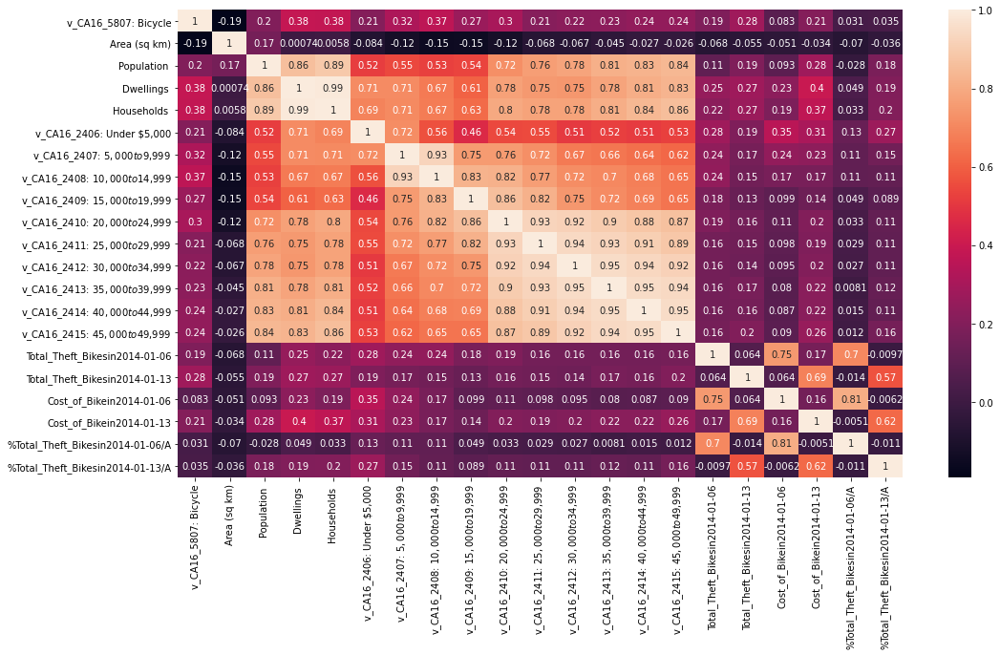

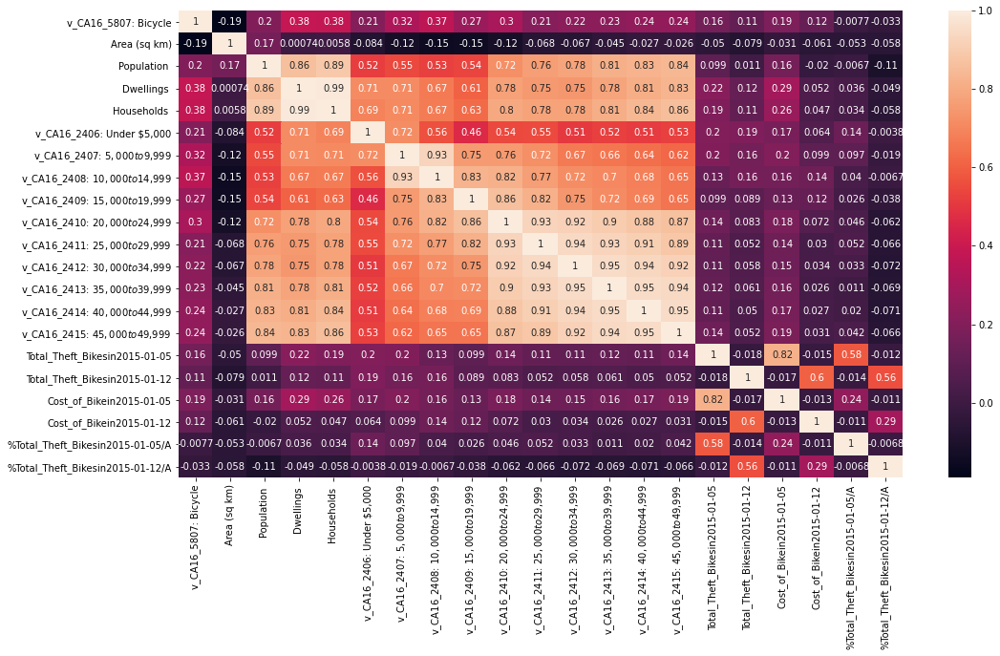

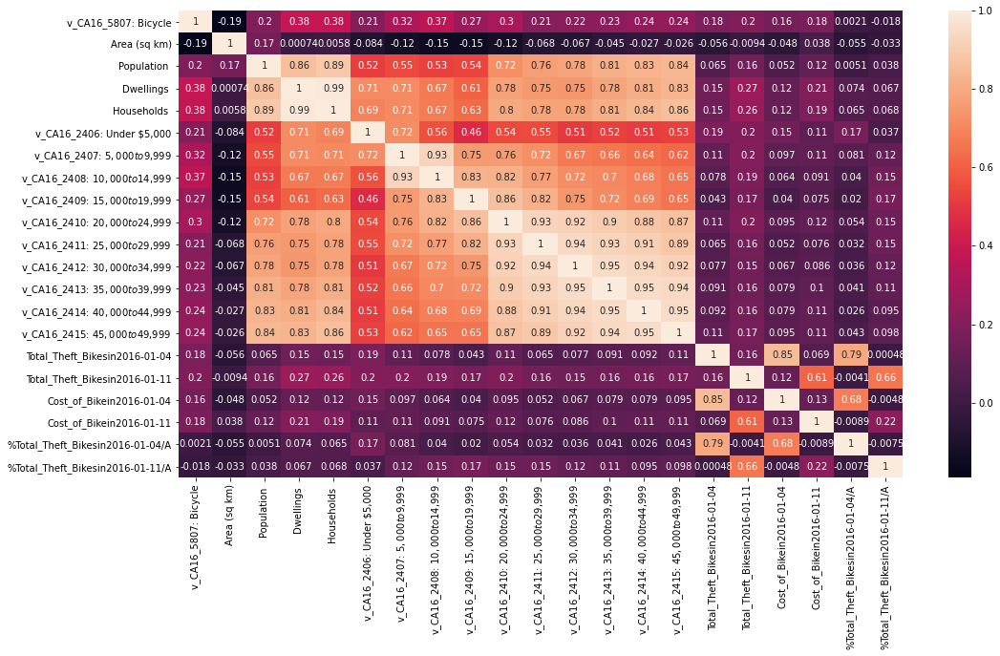

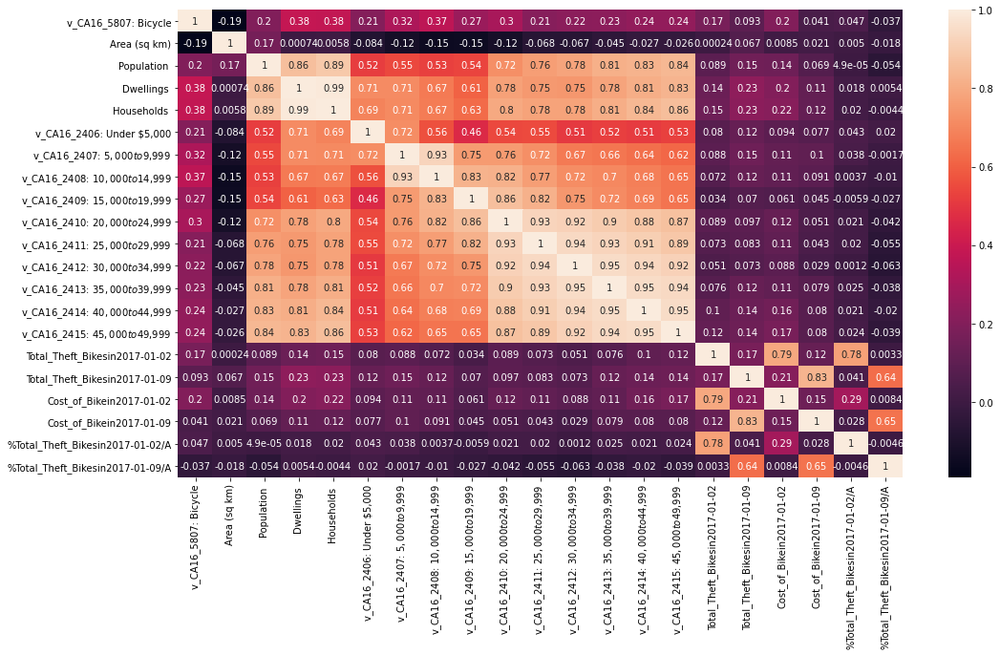

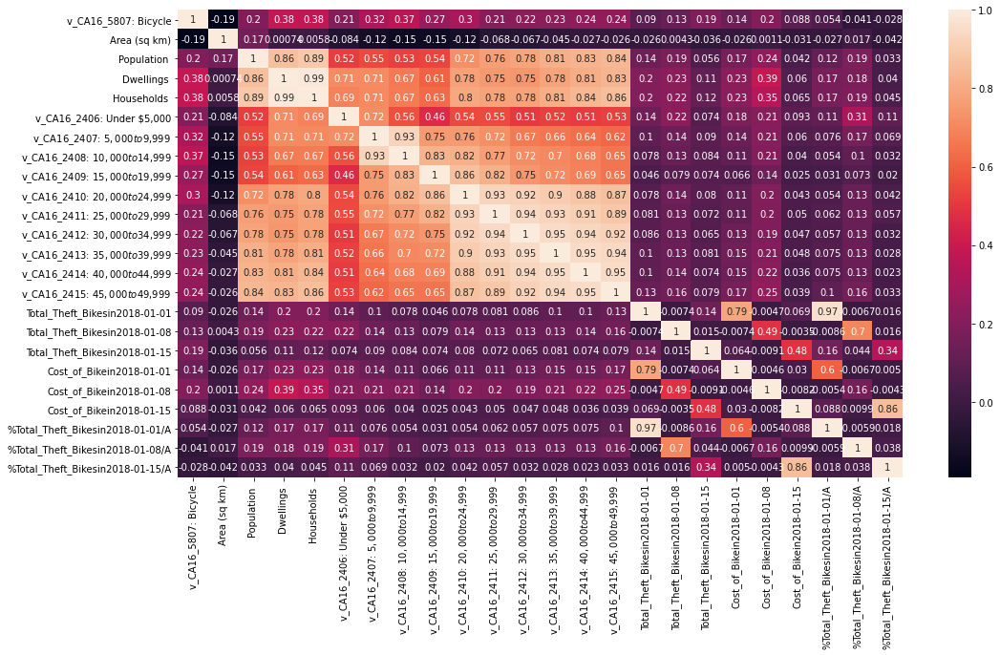

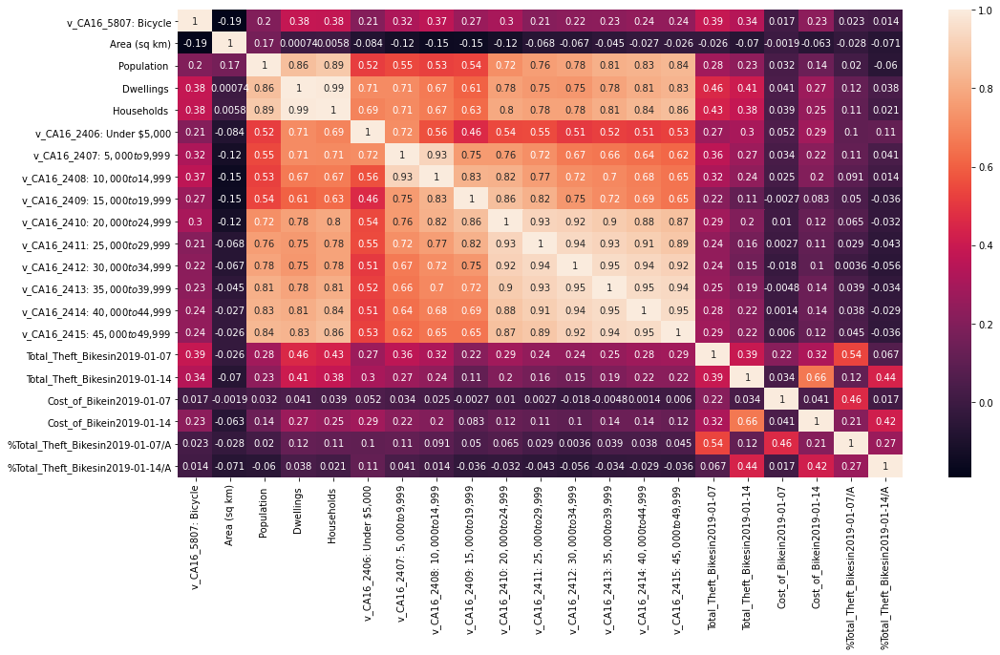

In [7]:
fields_census_analysis(census_path = "./Data/DataCensus_100_5.csv")

Index(['GeoUID', 'Occurrence_Date', 'Total_Theft_Bikes', 'Cost_of_Bike',
       'Occurrence_Year'],
      dtype='object')

Index(['v_CA16_5807: Bicycle', 'GeoUID', 'Area (sq km)', 'Population ',
       'Dwellings ', 'Households ', 'v_CA16_2416: $50,000 to $59,999',
       'v_CA16_2417: $60,000 to $69,999', 'v_CA16_2418: $70,000 to $79,999',
       'v_CA16_2419: $80,000 to $89,999', 'v_CA16_2420: $90,000 to $99,999',
       'v_CA16_2447: Median total income of economic families in 2015 ($)',
       'v_CA16_2449: Average family size of economic families',
       'v_CA16_2451: Median total income of couple economic families without children or other relatives in 2015 ($)',
       'v_CA16_2453: Average family size of couple economic families without children or other relatives',
       'v_CA16_2455: Median total income of couple economic families with children in 2015 ($)'],
      dtype='object')

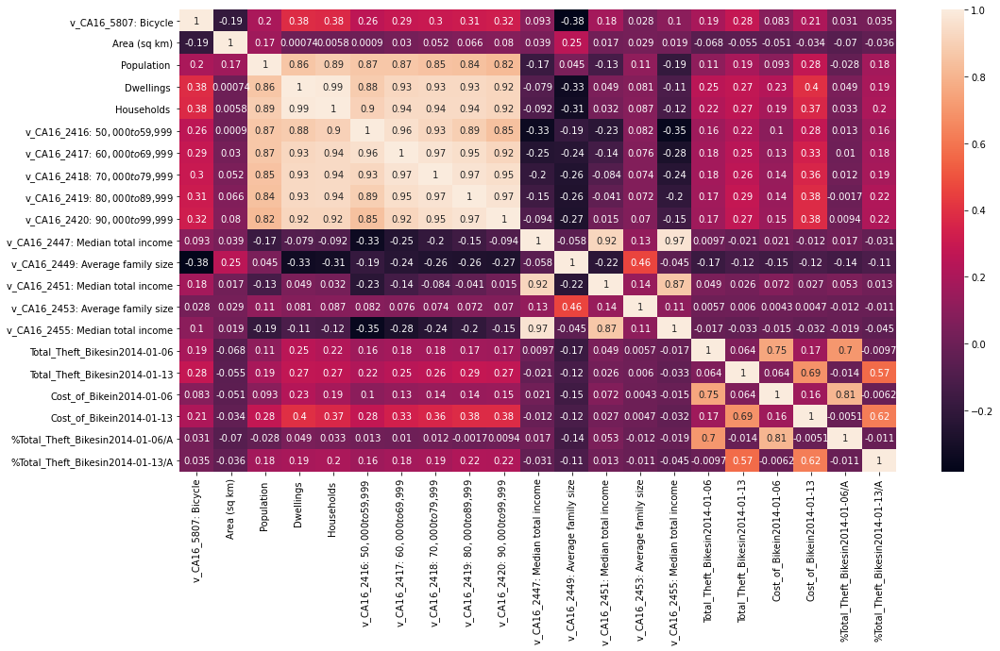

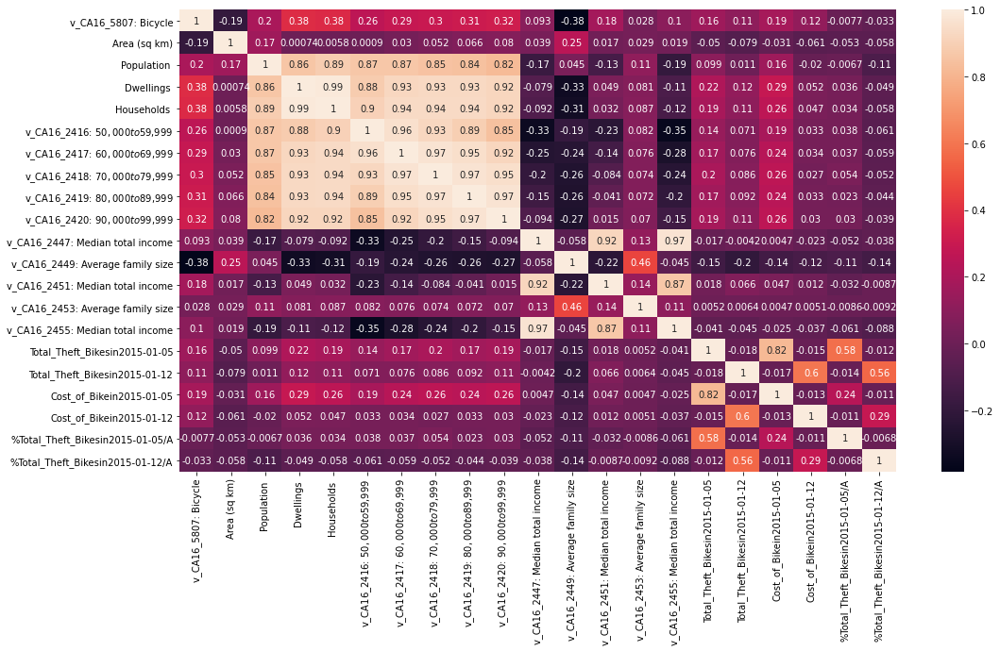

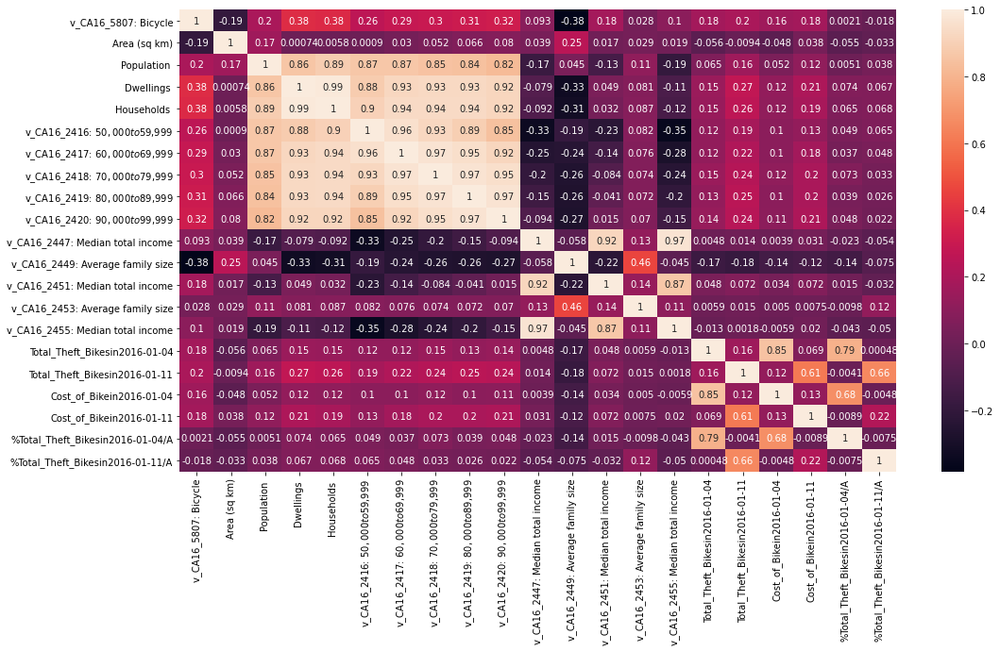

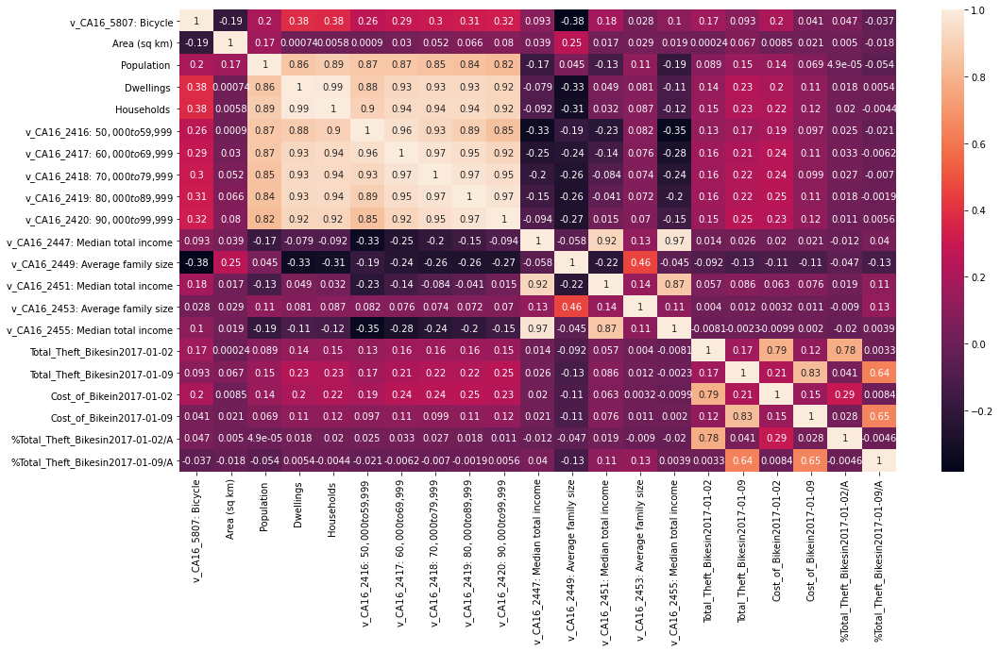

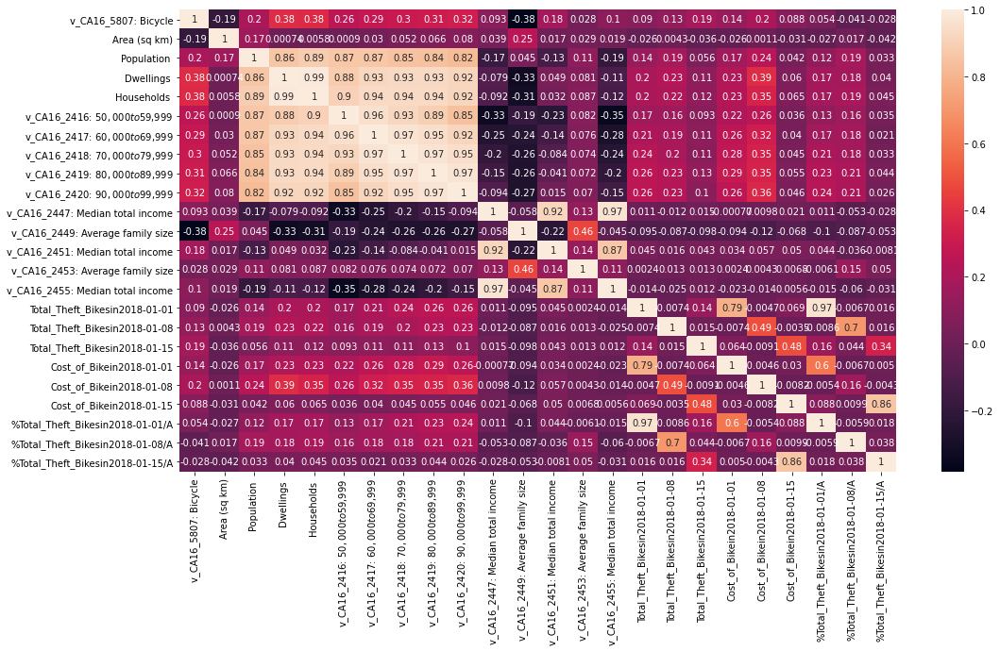

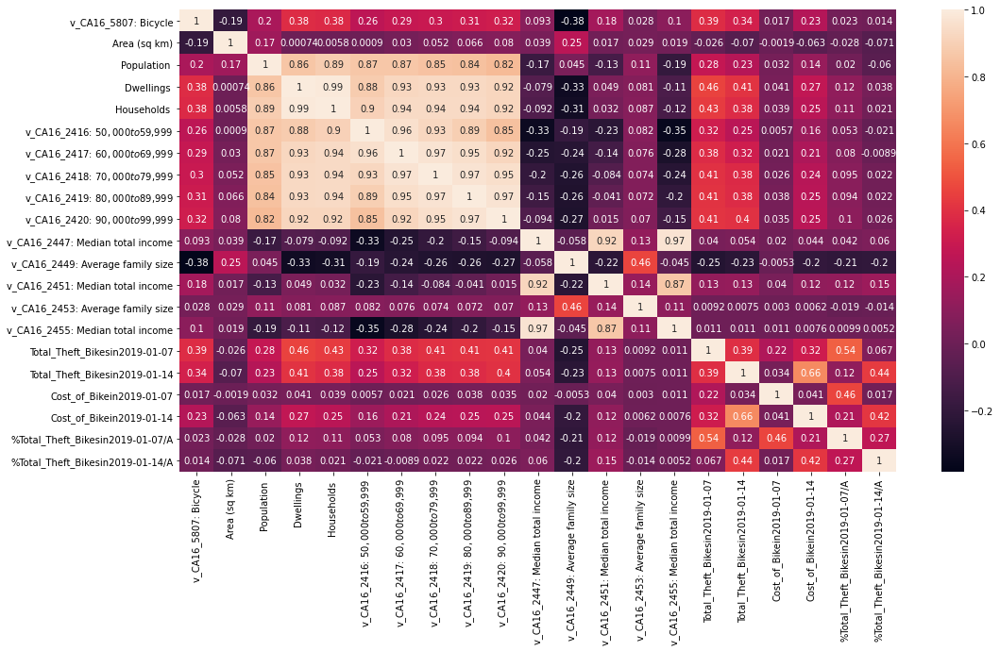

In [8]:
fields_census_analysis(census_path = "./Data/DataCensus_100_6.csv")

Index(['GeoUID', 'Occurrence_Date', 'Total_Theft_Bikes', 'Cost_of_Bike',
       'Occurrence_Year'],
      dtype='object')

Index(['v_CA16_5807: Bicycle', 'GeoUID', 'Area (sq km)', 'Population ',
       'Dwellings ', 'Households ',
       'v_CA16_2457: Average family size of couple economic families with children',
       'v_CA16_2459: Median total income of lone-parent economic families in 2015 ($)',
       'v_CA16_2461: Average family size of lone-parent economic families',
       'v_CA16_2465: Median total income in 2015 for persons aged 15 years and over not in economic families ($)',
       'v_CA16_2510: Total - Low-income status in 2015 for the population in private households to whom low-income concepts are applicable - 100% data',
       'v_CA16_2525: In low income based on the Low-income measure, after tax (LIM-AT)',
       'v_CA16_2540: Prevalence of low income based on the Low-income measure, after tax (LIM-AT) (%)',
       'v_CA16_2555: In low income based on the Low-income cut-offs, after tax (LICO-AT)',
       'v_CA16_2570: Prevalence of low income based on the Low-income cut-offs, after tax (

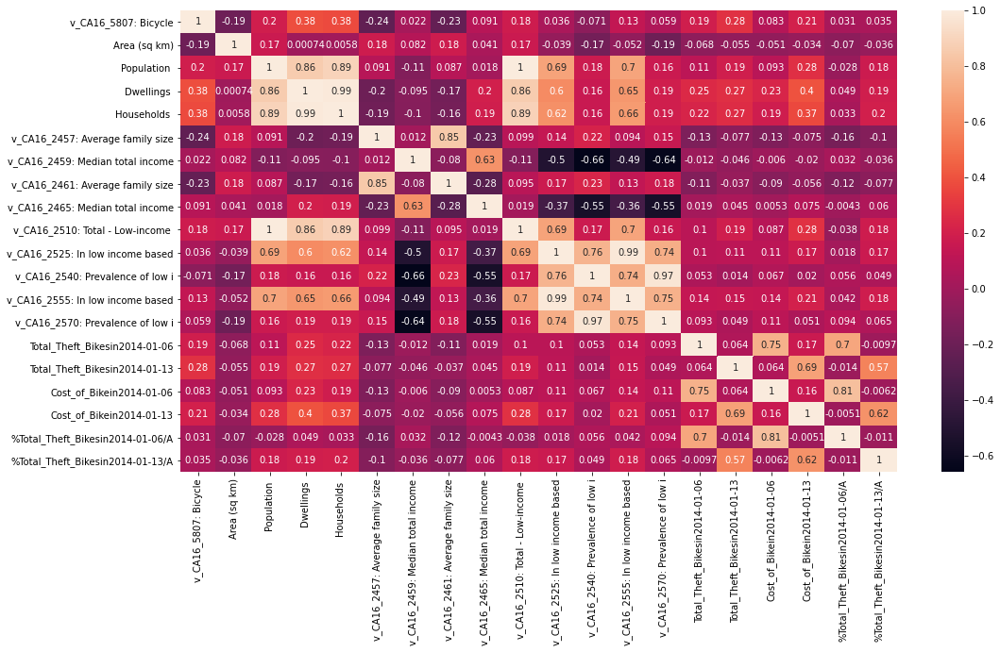

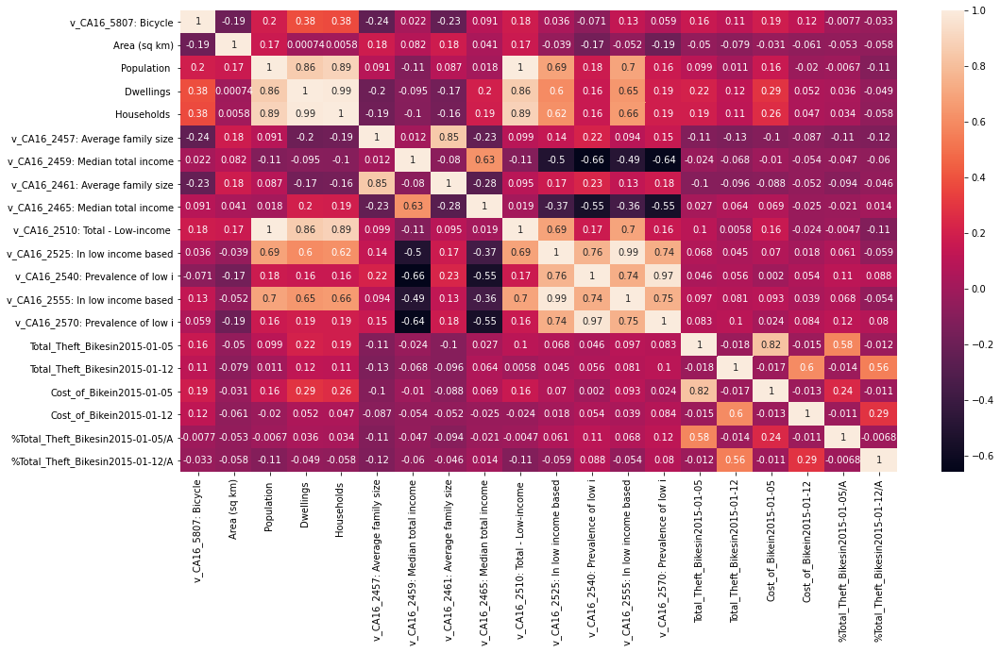

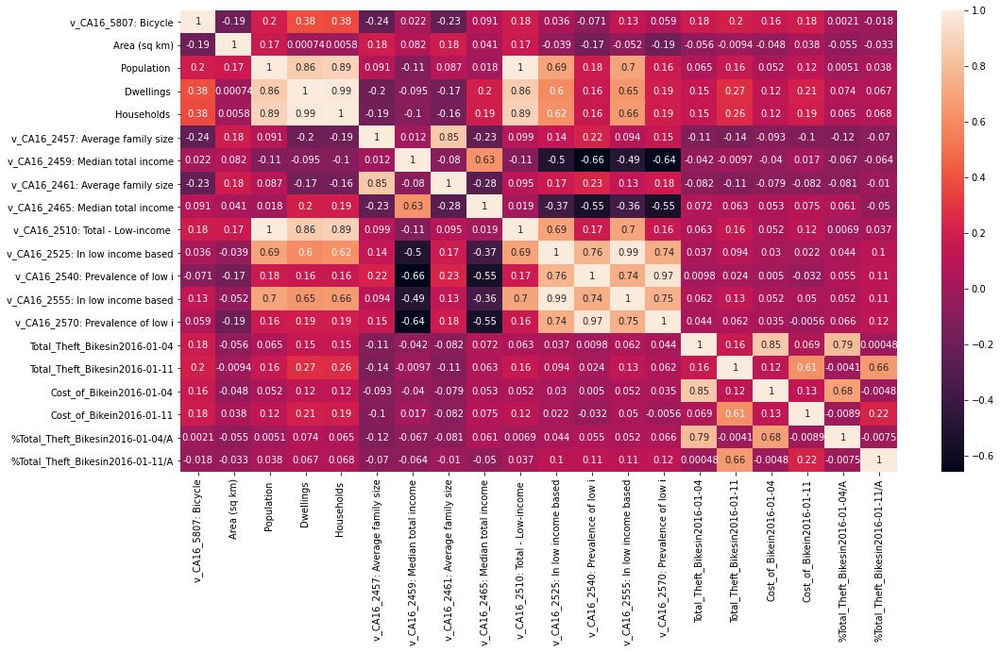

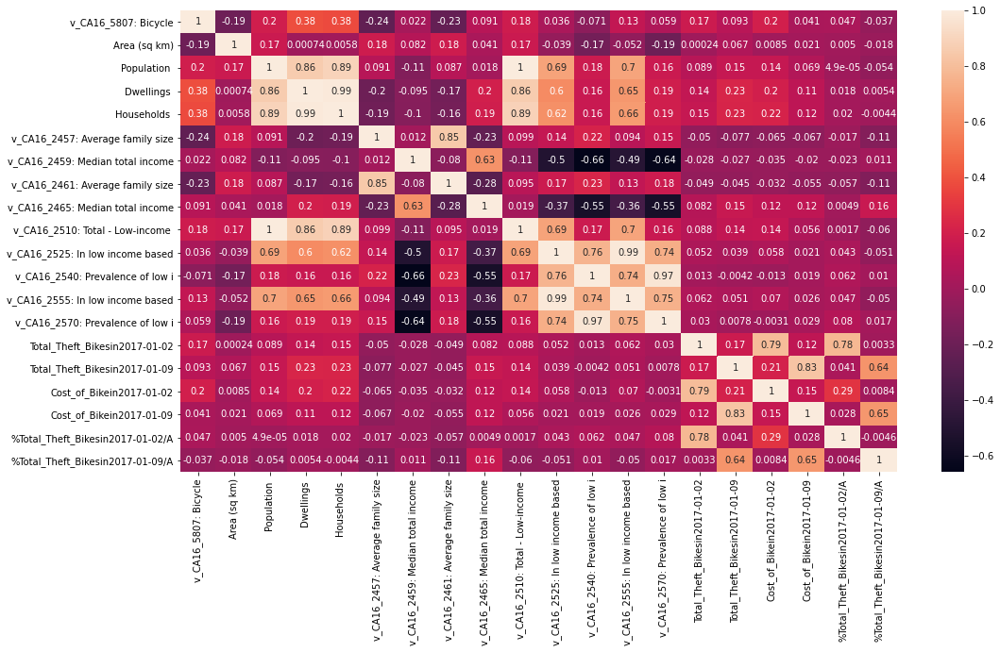

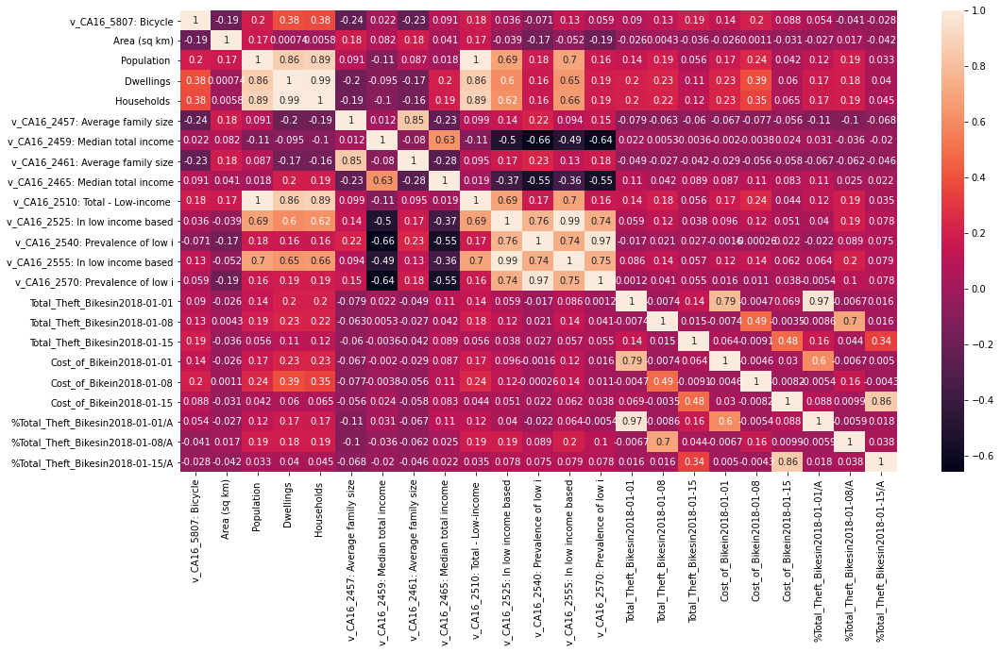

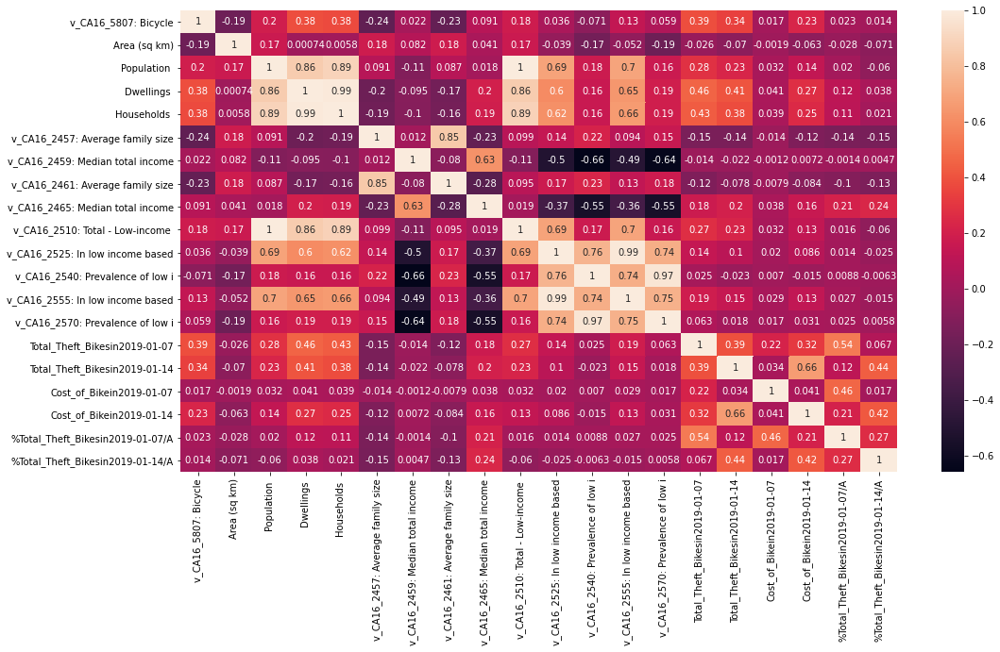

In [9]:
fields_census_analysis(census_path = "./Data/DataCensus_100_7.csv")

In [28]:
fields_census_analysis(census_path = "./Data/Reduce_variable_100.csv")

Output hidden; open in https://colab.research.google.com to view.

# Analisis anterior

## **Data sets description**

### **Thefts data sets**

INTRO

#### **Toronto data set**

This dataset contains Bicycle Thefts occurrences from **2014-2019** . The location of crime occurrences have been deliberately offset to the nearest road intersection node to protect the privacy of parties involved in the occurrence. All location data must be considered as an approximate location of the occurrence and users are advised not to interpret any of these locations as related to a specific address or individual, it has a total of 26 features. The data set can be found [here](https://https://data.torontopolice.on.ca/datasets/698717de582845458159a73ad4a2a8e0_0?geometry=-80.680%2C43.538%2C-78.066%2C43.885)

<table style="undefined;table-layout: fixed; width: 726px">
<colgroup>
<col style="width: 154px">
<col style="width: 375px">
<col style="width: 110px">
<col style="width: 87px">
</colgroup>
<thead>
  <tr>
    <th>Field</th>
    <th>Field Description</th>
    <th>Variable Type</th>
    <th>Num of Unique values</th>
  </tr>
</thead>
<tbody>
  <tr>
    <td>X</td>
    <td>Location in cartetian coordinates (X)</td>
    <td>float</td>
    <td>4885</td>
  </tr>
  <tr>
    <td>Y</td>
    <td>Location in cartetian coordinates (Y)</td>
    <td>float</td>
    <td>4874</td>
  </tr>
  <tr>
    <td>FID</td>
    <td>ID </td>
    <td>int</td>
    <td>21584</td>
  </tr>
  <tr>
    <td>Index</td>
    <td>Record Unique Identifier</td>
    <td>int</td>
    <td>21584</td>
  </tr>
  <tr>
    <td>event_unique_id</td>
    <td>Event Occurrence Identifier</td>
    <td>String</td>
    <td>19350</td>
  </tr>
  <tr>
    <td>Primary_Offence</td>
    <td>Offence related to the occurrence</td>
    <td>String</td>
    <td>65</td>
  </tr>
  <tr>
    <td>Occurrence_Date</td>
    <td>Date of occurrence</td>
    <td>String</td>
    <td>2104</td>
  </tr>
  <tr>
    <td>Occurrence_Year</td>
    <td>Occurrence year</td>
    <td>int</td>
    <td>6</td>
  </tr>
  <tr>
    <td>Occurrence_Month</td>
    <td>Occurrence Month</td>
    <td>int</td>
    <td>12</td>
  </tr>
  <tr>
    <td>Occurrence_Day</td>
    <td>Occurrence Day</td>
    <td>int</td>
    <td>31</td>
  </tr>
  <tr>
    <td>Occurrence_Time</td>
    <td>Occurrence Time</td>
    <td>String</td>
    <td>933</td>
  </tr>
  <tr>
    <td>Division</td>
    <td>Police Division where event occurred</td>
    <td>int</td>
    <td>18</td>
  </tr>
  <tr>
    <td>City</td>
    <td>City where event occurred</td>
    <td>String</td>
    <td>1</td>
  </tr>
  <tr>
    <td>Location_Type</td>
    <td>Location Type where event occurred</td>
    <td>String</td>
    <td>44</td>
  </tr>
  <tr>
    <td>Premise_Type</td>
    <td>Premise Type where event occurred</td>
    <td>String</td>
    <td>5</td>
  </tr>
  <tr>
    <td>Bike_Make</td>
    <td>Bicycle Make</td>
    <td>String</td>
    <td>725</td>
  </tr>
  <tr>
    <td>Bike_Model</td>
    <td>Bicycle Model</td>
    <td>String</td>
    <td>7008</td>
  </tr>
  <tr>
    <td>Bike_Type</td>
    <td>Bicycle Type</td>
    <td>String</td>
    <td>13</td>
  </tr>
  <tr>
    <td>Bike_Speed</td>
    <td>Bicycle Speed</td>
    <td>int</td>
    <td>62</td>
  </tr>
  <tr>
    <td>Bike_Colour</td>
    <td>Bicycle Colour</td>
    <td>String</td>
    <td>233</td>
  </tr>
  <tr>
    <td>Cost_of_Bike</td>
    <td>Cost of Bicycle</td>
    <td>float</td>
    <td>1458</td>
  </tr>
  <tr>
    <td>Status</td>
    <td>Status of event</td>
    <td>String</td>
    <td>3</td>
  </tr>
  <tr>
    <td>Hood_ID</td>
    <td>Neighbourhood Id</td>
    <td>int</td>
    <td>140</td>
  </tr>
  <tr>
    <td>Neighbourhood</td>
    <td>Neighbourhood name</td>
    <td>String</td>
    <td>140</td>
  </tr>
  <tr>
    <td>Lat</td>
    <td>Longitude of point extracted after offsetting X and &amp; Coordinates to&nbsp;&nbsp;&nbsp;nearest intersection node</td>
    <td>float</td>
    <td>4874</td>
  </tr>
  <tr>
    <td>Long</td>
    <td>Latitude of point extracted after offsetting X and &amp; Coordinates to&nbsp;&nbsp;&nbsp;nearest intersection node</td>
    <td>float</td>
    <td>4885</td>
  </tr>
</tbody>
</table>

#### **Ottawa data set**


This dataset contains Bicycle Thefts occurrences from **2015-2019** . The location of crime occurrences have been deliberately offset to the nearest road intersection node to protect the privacy of parties involved in the occurrence. All location data must be considered as an approximate location of the occurrence and users are advised not to interpret any of these locations as related to a specific address or individual, it has a total of 19 features. The data set can be found [here](https://https://open.ottawa.ca/datasets/3620cc7a3b874557bb288d889a4d56c2_0?geometry=-78.421%2C45.008%2C-73.194%2C45.683)

<table style="undefined;table-layout: fixed; width: 726px">
<colgroup>
<col style="width: 154px">
<col style="width: 375px">
<col style="width: 110px">
<col style="width: 87px">
</colgroup>
<thead>
  <tr>
    <th>Field</th>
    <th>Field Description</th>
    <th>Variable Type</th>
    <th>Num of Unique values</th>
  </tr>
</thead>
<tbody>
  <tr>
    <td>X</td>
    <td>Location in cartetian coordinates (X)</td>
    <td>float</td>
    <td>4885</td>
  </tr>
  <tr>
    <td>Y</td>
    <td>Location in cartetian coordinates (Y)</td>
    <td>float</td>
    <td>4874</td>
  </tr>
  <tr>
    <td>FID</td>
    <td>ID </td>
    <td>int</td>
    <td>21584</td>
  </tr>
  <tr>
    <td>Index</td>
    <td>Record Unique Identifier</td>
    <td>int</td>
    <td>21584</td>
  </tr>
  <tr>
    <td>event_unique_id</td>
    <td>Event Occurrence Identifier</td>
    <td>String</td>
    <td>19350</td>
  </tr>
  <tr>
    <td>Primary_Offence</td>
    <td>Offence related to the occurrence</td>
    <td>String</td>
    <td>65</td>
  </tr>
  <tr>
    <td>Occurrence_Date</td>
    <td>Date of occurrence</td>
    <td>String</td>
    <td>2104</td>
  </tr>
  <tr>
    <td>Occurrence_Year</td>
    <td>Occurrence year</td>
    <td>int</td>
    <td>6</td>
  </tr>
  <tr>
    <td>Occurrence_Month</td>
    <td>Occurrence Month</td>
    <td>int</td>
    <td>12</td>
  </tr>
  <tr>
    <td>Occurrence_Day</td>
    <td>Occurrence Day</td>
    <td>int</td>
    <td>31</td>
  </tr>
  <tr>
    <td>Occurrence_Time</td>
    <td>Occurrence Time</td>
    <td>String</td>
    <td>933</td>
  </tr>
  <tr>
    <td>Division</td>
    <td>Police Division where event occurred</td>
    <td>int</td>
    <td>18</td>
  </tr>
  <tr>
    <td>City</td>
    <td>City where event occurred</td>
    <td>String</td>
    <td>1</td>
  </tr>
  <tr>
    <td>Location_Type</td>
    <td>Location Type where event occurred</td>
    <td>String</td>
    <td>44</td>
  </tr>
  <tr>
    <td>Premise_Type</td>
    <td>Premise Type where event occurred</td>
    <td>String</td>
    <td>5</td>
  </tr>
  <tr>
    <td>Bike_Make</td>
    <td>Bicycle Make</td>
    <td>String</td>
    <td>725</td>
  </tr>
  <tr>
    <td>Bike_Model</td>
    <td>Bicycle Model</td>
    <td>String</td>
    <td>7008</td>
  </tr>
  <tr>
    <td>Bike_Type</td>
    <td>Bicycle Type</td>
    <td>String</td>
    <td>13</td>
  </tr>
  <tr>
    <td>Bike_Speed</td>
    <td>Bicycle Speed</td>
    <td>int</td>
    <td>62</td>
  </tr>
  <tr>
    <td>Bike_Colour</td>
    <td>Bicycle Colour</td>
    <td>String</td>
    <td>233</td>
  </tr>
  <tr>
    <td>Cost_of_Bike</td>
    <td>Cost of Bicycle</td>
    <td>float</td>
    <td>1458</td>
  </tr>
  <tr>
    <td>Status</td>
    <td>Status of event</td>
    <td>String</td>
    <td>3</td>
  </tr>
  <tr>
    <td>Hood_ID</td>
    <td>Neighbourhood Id</td>
    <td>int</td>
    <td>140</td>
  </tr>
  <tr>
    <td>Neighbourhood</td>
    <td>Neighbourhood name</td>
    <td>String</td>
    <td>140</td>
  </tr>
  <tr>
    <td>Lat</td>
    <td>Longitude of point extracted after offsetting X and &amp; Coordinates to&nbsp;&nbsp;&nbsp;nearest intersection node</td>
    <td>float</td>
    <td>4874</td>
  </tr>
  <tr>
    <td>Long</td>
    <td>Latitude of point extracted after offsetting X and &amp; Coordinates to&nbsp;&nbsp;&nbsp;nearest intersection node</td>
    <td>float</td>
    <td>4885</td>
  </tr>
</tbody>
</table>

### **Census data set**

These 2016 Census data set provide statistical information about the population, age and sex, type of dwelling, families, households and marital status, language among other features. In general terms, the census information is segmented into different geographical units, such as: Census Metropolitan Areas (CMA), Census Division (CD), Census Branch (CSD), Census Area (CT) and Dissemination Area (DA).  For this study, the CT, which is a small and relatively stable area, will be taken as the geographic unit. Census areas usually have a population of 2,500 to 8,000 people. They are located in large urban centers that should have a central urban population of 50,000 or more. Data was obtained from  [[1]](https://https://www12.statcan.gc.ca/census-recensement/2016/dp-pd/index-eng.cfm) and  [[2]](https://https://censusmapper.ca/) 

The following is a statistical analysis for the **cities of Toronto and Ottawa**


In the next table are shown the set of caracteristics for the population data set:

<table>
<thead>
  <tr>
    <th>Field</th>
    <th>Field description</th>
    <th>Variable Type</th>
    <th>Num of unique values</th>
  </tr>
</thead>
<tbody>
  <tr>
    <td>GeoUID</td>
    <td>Region id</td>
    <td>float64</td>
    <td>204</td>
  </tr>
  <tr>
    <td>Type</td>
    <td>Subdivision type (Census Track)</td>
    <td>String</td>
    <td>1</td>
  </tr>
  <tr>
    <td>Region Name</td>
    <td>Subdivision Name</td>
    <td>String</td>
    <td>4</td>
  </tr>
  <tr>
    <td>Area (sq km)</td>
    <td>Area in squer Kilimeters</td>
    <td>float64</td>
    <td>203</td>
  </tr>
  <tr>
    <td>Dwellings</td>
    <td>Number of houses</td>
    <td>int64</td>
    <td>196</td>
  </tr>
  <tr>
    <td>Households</td>
    <td>Number of people who live in the <br>house</td>
    <td>int64</td>
    <td>187</td>
  </tr>
  <tr>
    <td>v_CA16_401: Population, 2016</td>
    <td>Number of people in the region </td>
    <td>int64</td>
    <td>201</td>
  </tr>
  <tr>
    <td>v_CA16_406: Population density per square kilometre</td>
    <td>Population density per square <br>kilometre</td>
    <td>float64</td>
    <td>203</td>
  </tr>
  <tr>
    <td>v_CA16_407: Land area in square kilometres</td>
    <td>Land area in square kilometres</td>
    <td>float64</td>
    <td>167</td>
  </tr>
</tbody>
</table>

In the next table are shown the set of caracteristics for the number of reported bikes data set:

<table>
<thead>
  <tr>
    <th>Field</th>
    <th>Field description</th>
    <th>Variable Type</th>
    <th>Num of unique values</th>
  </tr>
</thead>
<tbody>
  <tr>
    <td>GeoUID</td>
    <td>ID of subdivision</td>
    <td>float64</td>
    <td>204</td>
  </tr>
  <tr>
    <td>Type</td>
    <td>Subdivision type <br>(Census Track)</td>
    <td>object</td>
    <td>1</td>
  </tr>
  <tr>
    <td>Region Name</td>
    <td>Region Name</td>
    <td>object</td>
    <td>4</td>
  </tr>
  <tr>
    <td>Area (sq km)</td>
    <td>Region area</td>
    <td>float64</td>
    <td>203</td>
  </tr>
  <tr>
    <td>Population</td>
    <td>Population number</td>
    <td>int64</td>
    <td>201</td>
  </tr>
  <tr>
    <td>Dwellings</td>
    <td>House number</td>
    <td>int64</td>
    <td>196</td>
  </tr>
  <tr>
    <td>Households</td>
    <td>Person number</td>
    <td>int64</td>
    <td>187</td>
  </tr>
  <tr>
    <td>v_CA16_5809: Bicycle</td>
    <td>Number of bycicle reported<br>by women</td>
    <td>object</td>
    <td>24</td>
  </tr>
  <tr>
    <td>v_CA16_5808: Bicycle</td>
    <td>Number of bycicle reported<br>by men</td>
    <td>object</td>
    <td>32</td>
  </tr>
  <tr>
    <td>v_CA16_5807: Bicycle</td>
    <td>Total number of bycicle</td>
    <td>object</td>
    <td>45</td>
  </tr>
</tbody>
</table>

##**Data joint construction**

In order to make a comparison between the thefts carried out between the cities of *Ottawa* and *Toronto*, a new data set is created, which aims to summarize the information of population, number of bicycles reported (by area $Km^{2}$) and number of stolen bicycles data given certain location.



### Union of all data sets information

To carry out the analysis by region in each city, the census track (CT) is taken as a subdivision. First the population and bicycle data sets are imported for each city.

In [ ]:
######Importing data sets ##########
dp_ottawa=pd.read_csv('Data/Population/ontario_population_ottawa.csv',header=0) #population Ottawa per CT
dbikes_ottawa= pd.read_csv('Data/Bikes/ontario_bikes_Ottawa.csv',header=0) #Number of bikes Ottawa per CT
dp_toronto=pd.read_csv('Data/Population/toro_population_toronto.csv',header=0) #population Toronto per CT
dbikes_toronto= pd.read_csv('Data/Bikes/toto_bikes_toronto.csv',header=0) #Number of bikes Toronto per CT

#####To viasualize the general information of data sets #####
#display(dp_ottawa.info())
#dp_ottawa.nunique()
#display(dbikes_ottawa.info())
#dbikes_ottawa.nunique()
####Shape or tables 
print(dp_ottawa.shape)
print(dbikes_ottawa.shape)
print(dp_toronto.shape)
print(dbikes_toronto.shape)

(204, 11)
(204, 10)
(572, 11)
(572, 10)


In the next step is created a joint data set by city, with the information of population and number of bikes

In [ ]:
#####CREATE ONE MIX DATAFRAME FOR ALL DATA PER CITY ###########

Data_Ottawa_pop = dp_ottawa.merge(dbikes_ottawa, how = 'inner', left_on='GeoUID', right_on='GeoUID') #Joint data of population and bikes for ottawa
Data_toronto_pop = dp_toronto.merge(dbikes_toronto, how = 'inner', left_on='GeoUID', right_on='GeoUID') #Joint data of population and bikes for toronto


####Rename of some columns #######
Data_Ottawa_pop=Data_Ottawa_pop.rename(columns={'v_CA16_401: Population, 2016':'PopulationCT','v_CA16_406: Population density per square kilometre':'PopulationDensity',
                                                'v_CA16_407: Land area in square kilometres':'LandArea(skm)','v_CA16_5809: Bicycle':'BicycleF','v_CA16_5808: Bicycle':'BicycleM','v_CA16_5807: Bicycle':'BicycleT'})

Data_toronto_pop=Data_toronto_pop.rename(columns={'v_CA16_401: Population, 2016':'PopulationCT','v_CA16_406: Population density per square kilometre':'PopulationDensity',      
                                               'v_CA16_407: Land area in square kilometres':'LandArea(skm)','v_CA16_5809: Bicycle':'BicycleF','v_CA16_5808: Bicycle':'BicycleM','v_CA16_5807: Bicycle':'BicycleT'})

Data_Ottawa_pop.loc[132,'BicycleT']=0

Data_toronto_pop['BicycleT'] = pd.to_numeric(Data_toronto_pop['BicycleT'])
Data_Ottawa_pop['BicycleT'] = pd.to_numeric(Data_Ottawa_pop['BicycleT'])

# Data_Ottawa_pop.to_csv('Data/Data_Ottawa_pop.csv')
# Data_toronto_pop.to_csv('Data/Data_toronto_pop.csv')
#print('Done')

Different xxx and xxxx CTs are available for the cities of Toronto and Ottawa

In [ ]:
Data_toronto_pop.shape , Data_Ottawa_pop.shape  #Data of population and number of theft by city

((572, 20), (204, 20))


Considering that the bicycle theft databases provide the approximate location of the incident, this parameter is used to unify the databases. The thefts are grouped by CT

In [ ]:
###Theft information by city##
data_ottawa=pd.read_csv('Data/Bicycle_Theft_Ottawa_geo.csv',header=0) #Theft data by CT ottawa
data_toronto= pd.read_csv('Data/Bicycle_Thefts_Toronto_geo.csv',header=0) #Theft data by CT Toronto

Some work is done in order to group the information of population, number of bikes and bike thefts by city

In [ ]:
#Copy for pick the must important columns
Toronto_data=data_toronto[['Index_', 'event_unique_id', 'Primary_Offence',
       'Occurrence_Date', 'Occurrence_Year', 'Occurrence_Month',
       'Occurrence_Day', 'Occurrence_Time', 'Division', 'City',
       'Location_Type', 'Premise_Type', 'Bike_Make', 'Bike_Model', 'Bike_Type',
       'Bike_Speed', 'Bike_Colour', 'Cost_of_Bike', 'Status', 'Hood_ID',
       'Neighbourhood', 'Lat', 'Long', 'id']].copy()

Ottawa_data=data_ottawa[['ID', 'Division', 'Sector', 'Report_Date', 'Incident_Date',
       'Incident_Weekday', 'Location_Type', 'Primary_Offence', 'Neighbourhood',
       'Bicycle_Status', 'Bicycle_Value', 'Bicycle_Make', 'Bicycle_Model',
       'Bicycle_Type', 'Bicycle_Frame', 'Bicycle_Colour', 'Bicycle_Speed', 'x',
       'y','id']].copy()

Toronto_data=Toronto_data.rename(columns={'id':'GeoUID'}) #Final dataframe with theft data Toronto
Ottawa_data=Ottawa_data.rename(columns={'id':'GeoUID'}) #Final dataframe with theft data Ottawa

#####Configuration of OcurrenceDate##########
day_type = pd.api.types.CategoricalDtype(categories=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"], ordered=True)


Toronto_data['Occurrence_Date']=pd.to_datetime(Toronto_data['Occurrence_Date']) 
Toronto_data['Week_day']=Toronto_data['Occurrence_Date'].dt.day_name() 
Toronto_data["Week_day"] = Toronto_data["Week_day"].astype(day_type)

Ottawa_data['Incident_Date']=pd.to_datetime(Ottawa_data['Incident_Date']) 
Ottawa_data['Week_day']=Ottawa_data['Incident_Date'].dt.day_name() 
Ottawa_data["Week_day"] = Ottawa_data["Week_day"].astype(day_type)


In [ ]:
Ottawa_data.info() , Toronto_data.info()  #Data of theft by cities, agrouped by CT

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5652 entries, 0 to 5651
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   ID                5652 non-null   int64         
 1   Division          5652 non-null   object        
 2   Sector            5652 non-null   int64         
 3   Report_Date       5652 non-null   object        
 4   Incident_Date     5652 non-null   datetime64[ns]
 5   Incident_Weekday  5652 non-null   int64         
 6   Location_Type     5652 non-null   object        
 7   Primary_Offence   5652 non-null   object        
 8   Neighbourhood     5652 non-null   object        
 9   Bicycle_Status    5652 non-null   object        
 10  Bicycle_Value     5019 non-null   float64       
 11  Bicycle_Make      4890 non-null   object        
 12  Bicycle_Model     3367 non-null   object        
 13  Bicycle_Type      5381 non-null   object        
 14  Bicycle_Frame     5337 n

(None, None)

Finally, there is a single data set by city with all the summary information of population, number of bicycles and bicycles stolen by CT (Land area)

In [ ]:
####### CONCATENATION OF SETS ###############
JointOttawa = pd.merge(Data_Ottawa_pop, Ottawa_data, on='GeoUID', how='right') #JOINT DATA SET OF POPULATION, # BIKES , and THEFTS PER CT
JointToronto = pd.merge(Data_toronto_pop, Toronto_data, on='GeoUID', how='right') # JOINT DATA SET OF POPULATION, # BIKES , and THEFTS PER CT

### KEEP JUS THE MOST IMPORTANT COLUMNS #####
JointToronto.drop(['v_CA16_1: Age Stats', 'Type_y', 'Region Name_y',
       'Area (sq km)_y', 'Population _y', 'Dwellings _y', 'Households _y','Index_', 'event_unique_id','City','Premise_Type','Hood_ID'],axis=1,inplace=True)

JointOttawa.drop(['v_CA16_1: Age Stats', 'Type_y', 'Region Name_y',
       'Area (sq km)_y', 'Population _y', 'Dwellings _y', 'Households _y','ID','Sector','Report_Date','Incident_Weekday','Bicycle_Frame'],axis=1,inplace=True)

In [ ]:
######Change the name of columns for have the same information order of information by city #####
JointOttawa=JointOttawa.rename(columns={'Type_x':'Type', 'Region Name_x':'RegionName', 'Area (sq km)_x':'Area(sqKm)', 'Population _x':'Population',
       'Dwellings _x':'Dwellings', 'Households _x':'Households','Bicycle_Status':'Status','x':'Lat','y':'Long','Bicycle_Value':'Cost_of_Bike','Incident_Date':'Occurrence_Date',
       'Bicycle_Make':'Bike_Make', 'Bicycle_Model':'Bike_Model','Bicycle_Type':'Bike_Type', 'Bicycle_Colour':'Bike_Colour', 'Bicycle_Speed':'Bike_Speed'})

JointToronto=JointToronto.rename(columns={'Type_x':'Type', 'Region Name_x':'RegionName', 'Area (sq km)_x':'Area(sqKm)', 'Population _x':'Population',
       'Dwellings _x':'Dwellings', 'Households _x':'Households'})

###Add some dates columns in Ottawa Data set###
JointOttawa['Occurrence_Year']=JointOttawa['Occurrence_Date'].dt.year
JointOttawa['Occurrence_Month']=JointOttawa['Occurrence_Date'].dt.month
JointOttawa['Occurrence_Day']=JointOttawa['Occurrence_Date'].dt.day
JointOttawa['Occurrence_Time'] = pd.to_datetime(JointOttawa['Occurrence_Date'],format= '%H:%M:%S' ).dt.time

JointToronto['BikeDensity']=JointToronto['BicycleT']/JointToronto['LandArea(skm)'] #Numer of bikes by Km^2 Toronto
JointOttawa['BikeDensity']=JointOttawa['BicycleT']/JointOttawa['LandArea(skm)']  #Numer of bikes by Km^2 Toronto

JointToronto['City']='Toronto'
JointOttawa['City']='Ottawa'

####Reorganice the columns of DataFrames #####
JointToronto.sort_index(axis=1,inplace=True)
JointOttawa.sort_index(axis=1,inplace=True)

# JointOttawa.to_csv('Data/JointOttawa.csv')

In [ ]:
JointToronto.info() , JointOttawa.info() #Joint data of each city

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21584 entries, 0 to 21583
Data columns (total 34 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Area(sqKm)         21568 non-null  float64       
 1   BicycleF           21568 non-null  float64       
 2   BicycleM           21568 non-null  float64       
 3   BicycleT           21568 non-null  float64       
 4   BikeDensity        21568 non-null  float64       
 5   Bike_Colour        19855 non-null  object        
 6   Bike_Make          21584 non-null  object        
 7   Bike_Model         13443 non-null  object        
 8   Bike_Speed         21584 non-null  int64         
 9   Bike_Type          21584 non-null  object        
 10  City               21584 non-null  object        
 11  Cost_of_Bike       20048 non-null  float64       
 12  Division           21584 non-null  int64         
 13  Dwellings          21568 non-null  float64       
 14  GeoUID

(None, None)

Creation of just one data set with all the information for both cities

In [ ]:
CityJoint=pd.concat([JointToronto,JointOttawa],ignore_index=True) #Add the two data sets for both cities
CityJoint[['BicycleF', 'BicycleM', 'BicycleT']] = CityJoint[['BicycleF', 'BicycleM', 'BicycleT']].apply(pd.to_numeric)
#CityJoint.to_csv('Data/CityJoint.csv')

In [ ]:
CityJoint.info()  #All data for cities

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27236 entries, 0 to 27235
Data columns (total 34 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Area(sqKm)         27220 non-null  float64       
 1   BicycleF           27220 non-null  float64       
 2   BicycleM           27220 non-null  float64       
 3   BicycleT           27220 non-null  float64       
 4   BikeDensity        27220 non-null  float64       
 5   Bike_Colour        25117 non-null  object        
 6   Bike_Make          26474 non-null  object        
 7   Bike_Model         16810 non-null  object        
 8   Bike_Speed         27236 non-null  int64         
 9   Bike_Type          26965 non-null  object        
 10  City               27236 non-null  object        
 11  Cost_of_Bike       25067 non-null  float64       
 12  Division           27236 non-null  object        
 13  Dwellings          27220 non-null  float64       
 14  GeoUID

In [ ]:
Data_Ottawa_pop=Data_Ottawa_pop.rename(columns={'Type_x':'Type', 'Region Name_x':'RegionName', 'Area (sq km)_x':'Area(sqKm)', 'Population _x':'Population',
       'Dwellings _x':'Dwellings', 'Households _x':'Households'})

Data_toronto_pop=Data_toronto_pop.rename(columns={'Type_x':'Type', 'Region Name_x':'RegionName', 'Area (sq km)_x':'Area(sqKm)', 'Population _x':'Population',
       'Dwellings _x':'Dwellings', 'Households _x':'Households'})

In [ ]:
Data_TOR=pd.concat([Data_toronto_pop,Data_Ottawa_pop],ignore_index=True)
Data_TOR.drop(['v_CA16_1: Age Stats', 'Type_y', 'Region Name_y',
       'Area (sq km)_y', 'Population _y', 'Dwellings _y', 'Households _y'],axis=1,inplace=True)
#Data_TOR.shape , Data_Ottawa_pop.shape , Data_toronto_pop.shape
Data_TOR.columns
Data_TOR['GeoUID'].nunique()

776

In [ ]:
Data_TOR.info() #Union of information of population and bikes

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 776 entries, 0 to 775
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   GeoUID             776 non-null    float64
 1   Type               776 non-null    object 
 2   RegionName         776 non-null    object 
 3   Area(sqKm)         776 non-null    float64
 4   Population         776 non-null    int64  
 5   Dwellings          776 non-null    int64  
 6   Households         776 non-null    int64  
 7   PopulationCT       776 non-null    int64  
 8   PopulationDensity  776 non-null    float64
 9   LandArea(skm)      776 non-null    float64
 10  BicycleF           776 non-null    object 
 11  BicycleM           776 non-null    object 
 12  BicycleT           776 non-null    int64  
dtypes: float64(4), int64(5), object(4)
memory usage: 78.9+ KB


### Creation of data set by year
It is important to mention that the information of population and bicycles is assumed constant during the years given that the information of the census is obtained every [5 years](https://https://www12.statcan.gc.ca/census-recensement/index-eng.cfm), therefore, in order to consider the annual behavior of the bicycle theft, and given that the thefts are not registered in all the city in the same way in all the years, the CT where the information of theft is not found, it is assumed that there were not bicycle thefts in those places. 

In [ ]:
def drop_x(df):
    # list comprehension of the cols that end with '_y'
    to_drop = [x for x in df if x.endswith('_x')]
    df.drop(to_drop, axis=1, inplace=True)

In [ ]:
def ForDataFrameYear(Data_TOR,CityJoint,n_year):

  CityJoint_y=CityJoint[CityJoint['Occurrence_Year']==n_year]
  CityJoint_y = CityJoint_y.merge(Data_TOR,  how='right', on='GeoUID', suffixes=('_x', ''))
  drop_x(CityJoint_y)
  CityJoint_y["Status"].fillna("Bicycle_No_Theft", inplace = True) 
  CityJoint_y['City'].fillna(CityJoint_y['RegionName'],inplace=True)
  CityJoint_y['City'].replace({'Clarence-Rockland':'Ottawa','Russell':'Ottawa','North Grenville':'Ottawa'},inplace=True)
  return CityJoint_y
#CityJoint_2014['GeoUID'].nunique()

In [ ]:
CityJoint_2014= ForDataFrameYear(Data_TOR,CityJoint,2014)
CityJoint_2015= ForDataFrameYear(Data_TOR,CityJoint,2015)
CityJoint_2016= ForDataFrameYear(Data_TOR,CityJoint,2016)
CityJoint_2017= ForDataFrameYear(Data_TOR,CityJoint,2017)
CityJoint_2018= ForDataFrameYear(Data_TOR,CityJoint,2018)
CityJoint_2019= ForDataFrameYear(Data_TOR,CityJoint,2019)

In [ ]:
# CityJoint_2014.to_csv('Data/CityJoint_2014.csv')
# CityJoint_2015.to_csv('Data/CityJoint_2015.csv')
# CityJoint_2016.to_csv('Data/CityJoint_2016.csv')
# CityJoint_2017.to_csv('Data/CityJoint_2017.csv')
# CityJoint_2018.to_csv('Data/CityJoint_2018.csv')
# CityJoint_2019.to_csv('Data/CityJoint_2019.csv')
# CityJoint.to_csv('Data/CityJoint.csv')
# Data_TOR.to_csv('Data/Data_TOR.csv')

## **Statistical analysis and visualization**

In this section we analyze and compare the bicycle thefts in the cities of Toronoto and Ottawa

In general, in terms of surface area in $km^2$, Ottawa is much larger than Toronto, but this does not indicate that it has a larger population. According to data provided by governments, Toronto has a much higher population density than Ottawa. The following table summarizes some of these indicators, however, the percentage of the population that reported having a bicycle per square kilometer is very similar.

In [ ]:
def Create_DensityFrame(_Joint,_pop,LandArea_,Population_,bike):

  #Extraction of just stolen bikes status

  Year_aux=_Joint[_Joint['Status']=='STOLEN'].groupby(['Occurrence_Year','GeoUID']).size().reset_index().rename(columns={0:'Count'}) 
  Aux_Geo_ot = pd.merge(Year_aux,_pop[['GeoUID','PopulationCT']], on='GeoUID', how='left')
  Aux_Geo_2_ot=Aux_Geo_ot.groupby(['Occurrence_Year']).sum().reset_index().rename(columns={'Count':'SumThBikes'}) #Sum total per year

  #####NEW VARIABLES OF DENSITY ANALYSIS #########
  Aux_Geo_2_ot['BicycleT']=bike
  Aux_Geo_2_ot['BikesThDensity']=Aux_Geo_2_ot['SumThBikes']/LandArea_ #Theft bikes density
  Aux_Geo_2_ot['BikesDensity']=bike/ LandArea_#Bikes density
  Aux_Geo_2_ot['PopulationDensity'] = Population_/LandArea_ #Population Density
  Aux_Geo_2_ot['LandArea']=LandArea_
  Aux_Geo_2_ot['%Theft/sqKm'] = (Aux_Geo_2_ot['BikesThDensity']/Aux_Geo_2_ot['BikesDensity'])*100 #Percentage of stoles bikes by sq Km
  Aux_Geo_2_ot['%PopulationBike'] =(Aux_Geo_2_ot['BikesDensity']/Aux_Geo_2_ot['PopulationDensity'])*100 #Percentage of bikes by sq Km
  
  return Aux_Geo_2_ot

In [ ]:

def LineGrahp (Density,x_data,y_data,title):

  #fig = px.line(Density_Ottawa, x='Occurrence_Year', y='BikesDensity')
  fig = px.line(Density, x=x_data, y=y_data, title=title)
  fig.show()


#### Anual analysis

The following table presents a summary of the main indicators of interest for the cities of Ottawa and Toronto. It can be seen that given the large number of inhabitants in Toronto, there are approximately 4334 citizens for $Km^2$, while in Ottawa, despite being a large city, there are 272 inhabitants for $Km^2$. As it is expected the density of people with bicycles is higher in the city of Toronto, with approximately 54 for $Km^2$, nevertheless, the percentage of population that has a bicycle for $Km^2$ in both cities is similar. It is 1.16% and 1.25% for Ottawa and Toronto, respectively

In [ ]:
LandArea_Toronto=Data_toronto_pop['LandArea(skm)'].sum() #Asuming Land area constant during years
LandArea_Ottawa=Data_Ottawa_pop['LandArea(skm)'].sum() #Asuming Land area constant during years
Population_Ottawa=Data_Ottawa_pop['PopulationCT'].sum() #Asuming Population constant during years
Population_Toronto=Data_toronto_pop['PopulationCT'].sum() #Asuming Population constant during years
bikes_Toronto=Data_toronto_pop['BicycleT'].sum() #Asuming reported bikes constant during years
bikes_Ottawa=Data_Ottawa_pop['BicycleT'].sum() #Asuming reported bikes constant during years

OttawaD=CityJoint.loc[CityJoint['City']=='Ottawa']
TorontoD=CityJoint.loc[CityJoint['City']=='Toronto']

Density_Ottawa=Create_DensityFrame(OttawaD,Data_Ottawa_pop,LandArea_Ottawa,Population_Ottawa,bikes_Ottawa)
Density_Toronto=Create_DensityFrame(TorontoD,Data_toronto_pop,LandArea_Toronto,Population_Toronto,bikes_Toronto)

The following is a comparison of bicycle theft rates by city on an annual basis. First, some filters are applied to the data in order to obtain these graphs.

In [ ]:
Indexes_Ottawa=Density_Ottawa[['BicycleT','BikesDensity', 'PopulationDensity', 'LandArea', '%PopulationBike']].copy().drop_duplicates().T.rename(columns={0:'Ottawa'}) 
Indexes_Toronto=Density_Toronto[['BicycleT','BikesDensity', 'PopulationDensity', 'LandArea','%PopulationBike']].copy().drop_duplicates().T.rename(columns={0:'Toronto'}) 

pd.concat([Indexes_Ottawa,Indexes_Toronto],axis=1)

,Ottawa,Toronto
BicycleT,11520.000000,34330.000000
BikesDensity,3.165453,54.471313
PopulationDensity,272.505351,4334.175870
LandArea,3639.290000,630.240000
%PopulationBike,1.161611,1.256786


Below are the bicycle theft density graphs for each city. In Ottawa, a similar behavior is presented over the years, with an average value of 0.25 bicycles per $Km^2$. In Toronto, an increase is observed between 2014 and 2018, going from 4.6 to 6.11 bicycles stolen for $Km^2$. However, between 2018 and 2019 a slight decrease is observed, reaching a minimum value of 5.65 bicycles stolen for $Km^2$.

In [ ]:
LineGrahp(Density_Ottawa,'Occurrence_Year','BikesThDensity','Bike theft density for Ottawa')
LineGrahp(Density_Toronto,'Occurrence_Year','BikesThDensity','Bike theft density for Toronto')

The following chart shows the comparison of the percentage of stolen bicycles per year for $Km^2$. A stable behavior is observed between both cities during the years 2015 to 2018, and a slight decrease between 2018 and 2019 in both cities. However, the density of the percentage of bicycles stolen in the city of Toronto is generally higher than in the city of Ottawa by approximately 2 pp.

In [ ]:

fig = go.Figure()

fig.add_trace(go.Scatter(x=Density_Toronto['Occurrence_Year'],y=Density_Toronto['%Theft/sqKm'],mode='lines',name='Toronto city'))
fig.add_trace(go.Scatter(x=Density_Ottawa['Occurrence_Year'],y=Density_Ottawa['%Theft/sqKm'],mode='lines',name='Ottawa city'))

# Edit the layout
fig.update_layout(title='Percentage of bicycle theft per square kilometer',
                   xaxis_title='Year',
                   yaxis_title='%Theft/sqKm')
fig.show()

The following graph shows the information for the year 2016, in which both cities have a large number of thefts, it is noted that there is no information of all thefts of bicycles committed in the city, this space is compensated with information from the census assuming that there are zero thefts in this area (CT). It is represented with the status "Bicycle_No_Theft".

In [ ]:
Ottawa=CityJoint_2016[CityJoint_2016['City']=='Ottawa'].groupby(['City','GeoUID','Status']).size().reset_index().rename(columns={0:'Count'})
Toronto=CityJoint_2016[CityJoint_2016['City']=='Toronto'].groupby(['City','GeoUID','Status']).size().reset_index().rename(columns={0:'Count'})

labelsO = Ottawa['Status'].value_counts().index
valuesO = Ottawa['Status'].value_counts().values

labelsT = Toronto['Status'].value_counts().index
valuesT = Toronto['Status'].value_counts().values

# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=labelsO, values=valuesO, name="Ottawa"),
              1, 1)
fig.add_trace(go.Pie(labels=labelsT, values=valuesT, name="Toronto"),
              1, 2)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name")

fig.update_layout(
    title_text="Bicycle theft year 2016",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Ottawa', x=0.18, y=0.5, font_size=20, showarrow=False),
                 dict(text='Toronto', x=0.82, y=0.5, font_size=20, showarrow=False)])
fig.show()

#### Monthly analysis

This section seeks to analyze the information by month, in order to determine some behavior in the data, in each city

In [ ]:
### Bike theft by month##
Stolen_bikes_mon = CityJoint[CityJoint['Status']=='STOLEN'].groupby(['City','GeoUID','Neighbourhood','Occurrence_Month','PopulationCT', 'BicycleT', 'LandArea(skm)']).size().reset_index().rename(columns={0:'CountTheft'})
Stolen_bikes_mon.groupby(['City','GeoUID','Neighbourhood','Occurrence_Month']).sum().reset_index()
Stolen_bikes_mon['Bike_Density']=Stolen_bikes_mon['BicycleT']/Stolen_bikes_mon['LandArea(skm)']
Stolen_bikes_mon['BikeTheft_Density']=Stolen_bikes_mon['CountTheft']/Stolen_bikes_mon['LandArea(skm)']
Stolen_bikes_mon['%BikeTheft_Density']=(100*(Stolen_bikes_mon['CountTheft']*Stolen_bikes_mon['LandArea(skm)']))/Stolen_bikes_mon['BicycleT']
Stolen_bikes_mon['%BikeTheft_Density2']=(100*Stolen_bikes_mon['BikeTheft_Density'])/Stolen_bikes_mon['Bike_Density']
Stolen_bikes_mon['%BikeTheft_Density'] = Stolen_bikes_mon['%BikeTheft_Density'].replace(np.inf, 0)
Stolen_bikes_mon['%BikeTheft_Density2'] = Stolen_bikes_mon['%BikeTheft_Density2'].replace(np.inf, 0)
#Stolen_bikes_mon_2014['%_TheftDensity'] = 100*(Stolen_bikes_mon_2014['Count'] *  Stolen_bikes_mon_2014['LandArea(skm)']) / Stolen_bikes_mon_2014['BicycleT']
#Stolen_bikes_mon_2014[(Stolen_bikes_mon_2014['Occurrence_Month']==12)]
Stolen_bikes_mon.describe() 

,GeoUID,Occurrence_Month,PopulationCT,BicycleT,LandArea(skm),CountTheft,Bike_Density,BikeTheft_Density,%BikeTheft_Density,%BikeTheft_Density2
count,5.791000e+03,5791.000000,5791.000000,5791.000000,5791.000000,5791.000000,5791.000000,5791.000000,5791.000000,5791.000000
mean,5.283675e+06,6.989639,5040.766880,107.480573,1.702070,4.500432,224.977176,9.093395,13.996405,8.784889
std,1.246321e+05,2.819234,2211.129601,124.520976,8.126638,8.270865,309.514264,18.885785,68.830551,25.462631
min,5.050001e+06,1.000000,64.000000,0.000000,0.080000,1.000000,0.000000,0.003879,0.000000,0.000000
25%,5.350010e+06,5.000000,3666.000000,15.000000,0.440000,1.000000,12.345679,1.075269,0.584615,1.224490
50%,5.350079e+06,7.000000,4765.000000,55.000000,0.740000,2.000000,75.000000,2.666667,2.509091,3.648649
75%,5.350218e+06,9.000000,6031.000000,160.000000,1.340000,5.000000,320.512821,8.196721,9.900000,10.000000
max,5.350802e+06,12.000000,17549.000000,740.000000,257.800000,157.000000,1642.857143,300.000000,1718.666667,790.000000


It is observed that by month, the place where more thefts occurred was in the Church-Yonge Corridor of the city of Toronto

In [ ]:
Stolen_bikes_mon.describe(include='O') 

,City,Neighbourhood
count,5791,5791
unique,2,244
top,Toronto,Church-Yonge Corridor (75)
freq,4508,127


According to the box chart, it can be seen that in general the average theft density in the city of Toronto is higher

In [ ]:
fig = px.box(Stolen_bikes_mon, x="Occurrence_Month",y="BikeTheft_Density",color="City",title='Density of bike theft')
fig.show()

For the percentage of bicycle theft per square kilometer, the average in the city of Ottawa is higher despite having fewer bicycles

In [ ]:
fig = px.box(Stolen_bikes_mon, x="Occurrence_Month",y="%BikeTheft_Density",color="City",title='Percentage of theft bicycle by km^2')
fig.show()

In the histogram of thefts, per month, a normal distribution of the data per city is observed, which gives us an indication to be able to predict new information per month

In [ ]:
Stolen_bikes_mon = CityJoint[CityJoint['Status']=='STOLEN']
fig = px.histogram(Stolen_bikes_mon, x="Occurrence_Month", color="City")
fig.show()

In the histogram of Density thefts, per month, an exponential distribution of the data per city is observed, which gives us an indication to be able to predict new information per month

In [ ]:
Stolen_bikes_mon = CityJoint[CityJoint['Status']=='STOLEN'].groupby(['City','GeoUID','Neighbourhood','Occurrence_Month','PopulationCT', 'BicycleT', 'LandArea(skm)']).size().reset_index().rename(columns={0:'CountTheft'})
Stolen_bikes_mon.groupby(['City','GeoUID','Neighbourhood','Occurrence_Month']).sum().reset_index()
Stolen_bikes_mon['Bike_Density']=Stolen_bikes_mon['BicycleT']/Stolen_bikes_mon['LandArea(skm)']
Stolen_bikes_mon['BikeTheft_Density']=Stolen_bikes_mon['CountTheft']/Stolen_bikes_mon['LandArea(skm)']
Stolen_bikes_mon['%BikeTheft_Density']=(100*(Stolen_bikes_mon['CountTheft']*Stolen_bikes_mon['LandArea(skm)']))/Stolen_bikes_mon['BicycleT']
Stolen_bikes_mon['%BikeTheft_Density2']=(100*Stolen_bikes_mon['BikeTheft_Density'])/Stolen_bikes_mon['Bike_Density']
Stolen_bikes_mon['%BikeTheft_Density'] = Stolen_bikes_mon['%BikeTheft_Density'].replace(np.inf, 0)
Stolen_bikes_mon['%BikeTheft_Density2'] = Stolen_bikes_mon['%BikeTheft_Density2'].replace(np.inf, 0)
#Stolen_bikes_mon_2014['%_TheftDensity'] = 100*(Stolen_bikes_mon_2014['Count'] *  Stolen_bikes_mon_2014['LandArea(skm)']) / Stolen_bikes_mon_2014['BicycleT']
#Stolen_bikes_mon_2014[(Stolen_bikes_mon_2014['Occurrence_Month']==12)]
Stolen_bikes_mon.describe() 
fig = px.histogram(Stolen_bikes_mon, x="BikeTheft_Density", color="City")
fig.show()

#### Day Analysis

In [ ]:
Stolen_bikes_day = CityJoint[CityJoint['Status']=='STOLEN'].groupby(['Occurrence_Day','City']).size().reset_index().rename(columns={0:'CountTheft'})
Stolen_bikes_day

,Occurrence_Day,City,CountTheft
0,1,Ottawa,187
1,1,Toronto,737
2,2,Ottawa,148
3,2,Toronto,603
4,3,Ottawa,168
...,...,...,...
57,29,Toronto,623
58,30,Ottawa,139
59,30,Toronto,554
60,31,Ottawa,76


In [ ]:
Stolen_bikes_day = CityJoint[CityJoint['Status']=='STOLEN']
fig = px.histogram(Stolen_bikes_day, x="Occurrence_Day", color="City",nbins=50)
fig.show()

In [ ]:
# CityJoint_2014 = pd.read_csv('/content/gdrive/My Drive/IMT Atlantique/Data Science/Project Bycicle/bikes-theft-model/Data/CityJoint_2014.csv', header =0, index_col='Unnamed: 0')
# CityJoint_2015 = pd.read_csv('/content/gdrive/My Drive/IMT Atlantique/Data Science/Project Bycicle/bikes-theft-model/Data/CityJoint_2015.csv', header =0, index_col='Unnamed: 0')
# CityJoint_2016 = pd.read_csv('/content/gdrive/My Drive/IMT Atlantique/Data Science/Project Bycicle/bikes-theft-model/Data/CityJoint_2016.csv', header =0, index_col='Unnamed: 0')
# CityJoint_2017 = pd.read_csv('/content/gdrive/My Drive/IMT Atlantique/Data Science/Project Bycicle/bikes-theft-model/Data/CityJoint_2017.csv', header =0, index_col='Unnamed: 0')
# CityJoint_2018 = pd.read_csv('/content/gdrive/My Drive/IMT Atlantique/Data Science/Project Bycicle/bikes-theft-model/Data/CityJoint_2018.csv', header =0, index_col='Unnamed: 0')
# CityJoint_2019 = pd.read_csv('/content/gdrive/My Drive/IMT Atlantique/Data Science/Project Bycicle/bikes-theft-model/Data/CityJoint_2019Full.csv', header =0, index_col='Unnamed: 0')


In [ ]:
#CityJoint_2014Full.columns
#CityJoint.columns

In [ ]:
# Stolen_bikes_df_2014 = CityJoint_2014[CityJoint_2014['Status']=='STOLEN'].groupby(['City','Occurrence_Day','PopulationCT', 'BicycleT', 'Area(sqKm)']).size().reset_index().rename(columns={0:'Count'})
# Stolen_bikes_df_2014['%_TheftDensity'] = 100*(Stolen_bikes_df_2014['Count'] *  Stolen_bikes_df_2014['Area(sqKm)']) / Stolen_bikes_df_2014['BicycleT']

# Stolen_bikes_df_2015 = CityJoint_2015[CityJoint_2015['Status']=='STOLEN'].groupby(['City','Occurrence_Day','PopulationCT', 'BicycleT', 'Area(sqKm)']).size().reset_index().rename(columns={0:'Count'})
# Stolen_bikes_df_2015['%_TheftDensity'] = 100*(Stolen_bikes_df_2015['Count'] *  Stolen_bikes_df_2015['Area(sqKm)']) / Stolen_bikes_df_2015['BicycleT']

# Stolen_bikes_df_2016 = CityJoint_2016[CityJoint_2016['Status']=='STOLEN'].groupby(['City','Occurrence_Day','PopulationCT', 'BicycleT', 'Area(sqKm)']).size().reset_index().rename(columns={0:'Count'})
# Stolen_bikes_df_2016['%_TheftDensity'] = 100*(Stolen_bikes_df_2016['Count'] *  Stolen_bikes_df_2016['Area(sqKm)']) / Stolen_bikes_df_2016['BicycleT']

# Stolen_bikes_df_2017 = CityJoint_2017[CityJoint_2017['Status']=='STOLEN'].groupby(['City','Occurrence_Day','PopulationCT', 'BicycleT', 'Area(sqKm)']).size().reset_index().rename(columns={0:'Count'})
# Stolen_bikes_df_2017['%_TheftDensity'] = 100*(Stolen_bikes_df_2017['Count'] *  Stolen_bikes_df_2017['Area(sqKm)']) / Stolen_bikes_df_2017['BicycleT']

# Stolen_bikes_df_2018 = CityJoint_2018[CityJoint_2018['Status']=='STOLEN'].groupby(['City','Occurrence_Day','PopulationCT', 'BicycleT', 'Area(sqKm)']).size().reset_index().rename(columns={0:'Count'})
# Stolen_bikes_df_2018['%_TheftDensity'] = 100* (Stolen_bikes_df_2018['Count'] *  Stolen_bikes_df_2018['Area(sqKm)']) / Stolen_bikes_df_2018['BicycleT']

# Stolen_bikes_df_2019 = CityJoint_2019[CityJoint_2019['Status']=='STOLEN'].groupby(['City','Occurrence_Day','PopulationCT', 'BicycleT', 'Area(sqKm)']).size().reset_index().rename(columns={0:'Count'})
# Stolen_bikes_df_2019['%_TheftDensity'] = 100*(Stolen_bikes_df_2019['Count'] *  Stolen_bikes_df_2019['Area(sqKm)']) / Stolen_bikes_df_2019['BicycleT']

In [ ]:
# Stolen_bikes_df_2018

In [ ]:

# Stolen_bikes_johan_2014 = CityJoint_2014[CityJoint_2014['Status']=='STOLEN'].groupby(['City','GeoUID','Occurrence_Month',
#        'Occurrence_Time','Occurrence_Day','PopulationCT', 'BicycleT', 'Area(sqKm)']).size().reset_index().rename(columns={0:'CountTheft'})

# Stolen_bikes_johan_2015 = CityJoint_2015[CityJoint_2015['Status']=='STOLEN'].groupby(['City','GeoUID','Occurrence_Month',
#        'Occurrence_Time','Occurrence_Day','PopulationCT', 'BicycleT', 'Area(sqKm)']).size().reset_index().rename(columns={0:'CountTheft'})

# Stolen_bikes_johan_2016 = CityJoint_2016[CityJoint_2016['Status']=='STOLEN'].groupby(['City','GeoUID','Occurrence_Month',
#        'Occurrence_Time','Occurrence_Day','PopulationCT', 'BicycleT', 'Area(sqKm)']).size().reset_index().rename(columns={0:'CountTheft'})

# Stolen_bikes_johan_2017 = CityJoint_2017[CityJoint_2017['Status']=='STOLEN'].groupby(['City','GeoUID','Occurrence_Month',
#        'Occurrence_Time','Occurrence_Day','PopulationCT', 'BicycleT', 'Area(sqKm)']).size().reset_index().rename(columns={0:'CountTheft'})

# Stolen_bikes_johan_2018 = CityJoint_2018[CityJoint_2018['Status']=='STOLEN'].groupby(['City','GeoUID','Occurrence_Month',
#        'Occurrence_Time','Occurrence_Day','PopulationCT', 'BicycleT', 'Area(sqKm)']).size().reset_index().rename(columns={0:'CountTheft'})

# Stolen_bikes_johan_2019 = CityJoint_2019[CityJoint_2019['Status']=='STOLEN'].groupby(['City','GeoUID','Occurrence_Month',
#        'Occurrence_Time','Occurrence_Day','PopulationCT', 'BicycleT', 'Area(sqKm)']).size().reset_index().rename(columns={0:'CountTheft'})

In [ ]:
# Stolen_bikes_johan_2014.to_csv('Data/Stolen_bikes_johan_2014.csv')
# Stolen_bikes_johan_2015.to_csv('Data/Stolen_bikes_johan_2015.csv')
# Stolen_bikes_johan_2016.to_csv('Data/Stolen_bikes_johan_2016.csv')
# Stolen_bikes_johan_2017.to_csv('Data/Stolen_bikes_johan_2017.csv')
# Stolen_bikes_johan_2018.to_csv('Data/Stolen_bikes_johan_2018.csv')
# Stolen_bikes_johan_2019.to_csv('Data/Stolen_bikes_johan_2019.csv')